# load packages

In [18]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas import read_csv
import scanpy as sc
from functools import reduce
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mplx
from anndata import AnnData, read_h5ad
import singlecellmultiomics.bamProcessing.bamToRNACounts

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
#sc.logging.print_versions()

/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/4044060535.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
sc.settings.set_figure_params(dpi=100)



In [9]:
table = pd.read_csv('compM_mm10geneStarts_clustered.bed', sep = '\t')
table['ensembl'] = [ob for ob in table['name'].str.split('.', expand = True)[0]]
table.head(2)

,#chrom,start,end,name,score,strand,thickStart,thickEnd,itemRGB,blockCount,blockSizes,blockStart,deepTools_group,ensembl
0,14,5894001,5904001,ENSMUSG00000079379.2,0.0,-,5894001,5904001,0,1,10000,5893996,cluster_1,ENSMUSG00000079379
1,14,6884962,6894962,ENSMUSG00000090691.3,0.0,-,6884962,6894962,0,1,10000,6884956,cluster_1,ENSMUSG00000090691


In [10]:
table2 = pd.read_csv('fig2_results_marloes/compM_mm10geneStarts.hmap.clusters.bed', sep = '\t')
table2.head(2)


,#chrom,start,end,name,score,strand,thickStart,thickEnd,itemRGB,blockCount,blockSizes,blockStart,deepTools_group
0,14,5894001,5904001,ENSMUSG00000079379.2,0.0,-,5894001,5904001,0,1,10000,5893996,cluster_1
1,14,6884962,6894962,ENSMUSG00000090691.3,0.0,-,6884962,6894962,0,1,10000,6884956,cluster_1


# methylation data

In [11]:
table3 = pd.read_csv('methylation_table_mm10regions.tsv', sep = '\t')
table3['.id'] = table3['.id'].str.replace('promoter','Promoter')
table3['.id'] = table3['.id'].str.replace('genebody','Gene Body')
table3['.id'] = table3['.id'].str.replace('intergenic','Intergenic')
table3['.id'] = table3['.id'].str.replace('repeats','Repeats')
table3.head(2)



,.id,sample,sum_meth,sum_cov,meth_perc
0,Promoter,con1,6400,12252,52.236370
1,Promoter,con2,5315,13692,38.818288


In [13]:
table4 = pd.read_csv('methylation_table_mm10regions_clustered.tsv', sep = '\t')
table4.head(2)


,.id,sample,sum_meth,sum_cov,meth_perc
0,cluster_1,con1,1602,3993,40.120210
1,cluster_1,con2,1315,5015,26.221336


In [14]:
table4[['x','label']] = table4['.id'].str.split('_',expand=True)


In [15]:
sc.settings.set_figure_params(dpi=80, figsize = (5,5))

sns.set_style('ticks')
sns.set_context('talk')

Text(0, 0.5, 'Percentage CpG Methylation')

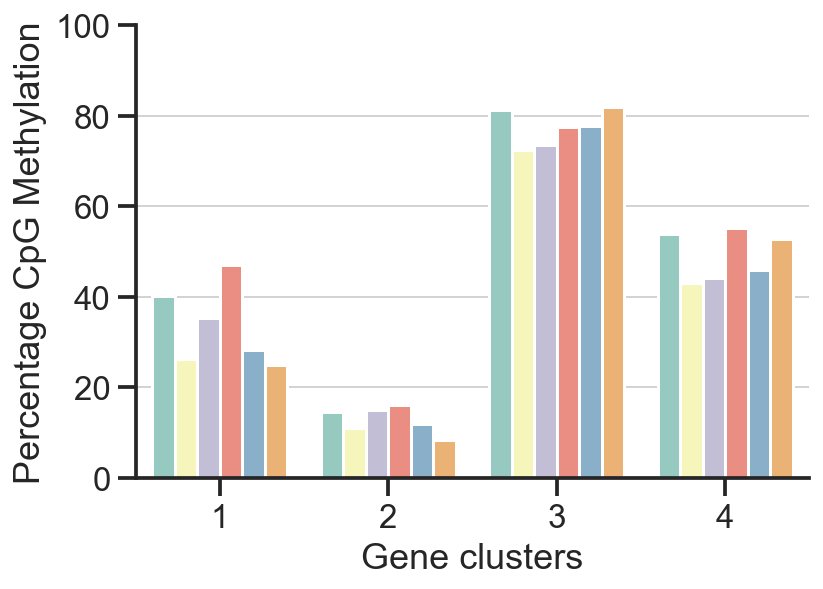

In [19]:
plt.axhline(80, color = 'lightgrey', linewidth = 1)
plt.axhline(60, color = 'lightgrey', linewidth = 1)
plt.axhline(40, color = 'lightgrey', linewidth = 1)
plt.axhline(20, color = 'lightgrey', linewidth = 1)
sns.barplot(data=table4,x='label',y='meth_perc',hue='sample',palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([0,100])
plt.xlabel('Gene clusters')
plt.ylabel('Percentage CpG Methylation')

Text(0, 0.5, 'Percentage CpG Methylation')

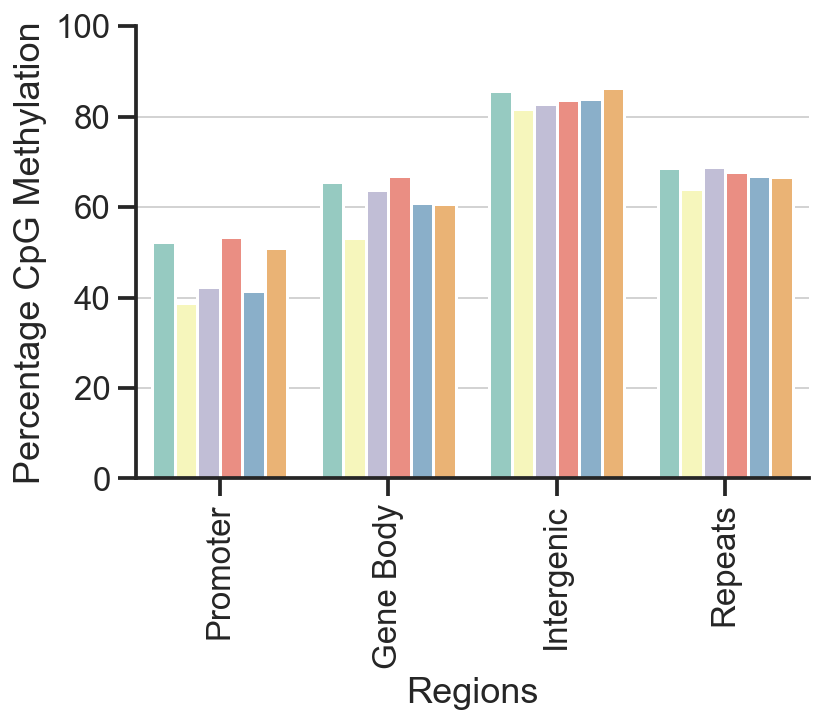

In [20]:
plt.axhline(80, color = 'lightgrey', linewidth = 1)
plt.axhline(60, color = 'lightgrey', linewidth = 1)
plt.axhline(40, color = 'lightgrey', linewidth = 1)
plt.axhline(20, color = 'lightgrey', linewidth = 1)
sns.barplot(data=table3,x='.id',y='meth_perc',hue='sample',palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([0,100])
plt.xticks(rotation=90)
plt.xlabel('Regions')
plt.ylabel('Percentage CpG Methylation')

# K27me3 data

In [24]:
table5 = pd.read_csv('fig2_results_marloes/chic_countdf_clusters.tsv', sep = '\t')
table5['sample'] = ['con1','con2','con3','con4','con5','con6']
table5['cluster1_perc'] = table5['cluster_1']/table5['total'] *100
table5['cluster2_perc'] = table5['cluster_2']/table5['total'] *100
table5['cluster3_perc'] = table5['cluster_3']/table5['total'] *100
table5['cluster4_perc'] = table5['cluster_4']/table5['total'] *100

table5

,cluster_1,cluster_2,cluster_3,cluster_4,total,sample,cluster1_perc,cluster2_perc,cluster3_perc,cluster4_perc
MB-mESCs-ChICK27me3-con1.bam,238144,448509,265119,79273,7363502,con1,3.234113,6.090974,3.600447,1.076567
MB-mESCs-ChICK27me3-con2.bam,169717,430147,239044,60202,7117575,con2,2.384478,6.043449,3.358503,0.845822
MB-mESCs-ChICK27me3-con3.bam,162644,369081,214296,60846,6133304,con3,2.651817,6.017654,3.493973,0.992059
MB-mESCs-ChICK27me3-con4.bam,238661,485272,288923,86666,7960154,con4,2.998196,6.096264,3.629616,1.088748
MB-mESCs-ChICK27me3-con5.bam,202975,435752,246916,69221,7038840,con5,2.883643,6.190679,3.507908,0.983415
MB-mESCs-ChICK27me3-con6.bam,203721,425929,241951,70493,6797083,con6,2.997183,6.266350,3.559630,1.037107


In [25]:
table2['deepTools_group'].value_counts().mean()

12317.5

In [26]:
tablek27_final = pd.read_csv('fig2_results_marloes/chic_countdf_clusters_normalized.tsv', sep = '\t')
tablek27_final.head(2)


,sample,cluster,value,condition
0,MB-mESCs-ChICK27me3-con1.bam,cluster_1,7.161456,con1
1,MB-mESCs-ChICK27me3-con2.bam,cluster_1,5.280066,con2


In [27]:
tablex = pd.read_csv('fig2_results_marloes/chic_countdf_clusters.tsv', sep = '\t')
tablex['cluster1_norm']  = tablex['cluster_1'] / table2['deepTools_group'].value_counts()['cluster_1']*table2['deepTools_group'].value_counts().mean()
tablex['cluster2_norm']  = tablex['cluster_2'] / table2['deepTools_group'].value_counts()['cluster_2']*table2['deepTools_group'].value_counts().mean()
tablex['cluster3_norm']  = tablex['cluster_3'] / table2['deepTools_group'].value_counts()['cluster_3']*table2['deepTools_group'].value_counts().mean()
tablex['cluster4_norm']  = tablex['cluster_4'] / table2['deepTools_group'].value_counts()['cluster_4']*table2['deepTools_group'].value_counts().mean()
tablex['sample'] = ['con1','con2','con3','con4','con5','con6']
tablex['cluster1_perc'] = tablex['cluster1_norm']/tablex['total'] *100
tablex['cluster2_perc'] = tablex['cluster2_norm']/tablex['total'] *100
tablex['cluster3_perc'] = tablex['cluster3_norm']/tablex['total'] *100
tablex['cluster4_perc'] = tablex['cluster4_norm']/tablex['total'] *100


tablex.head(2)

,cluster_1,cluster_2,cluster_3,cluster_4,total,cluster1_norm,cluster2_norm,cluster3_norm,cluster4_norm,sample,cluster1_perc,cluster2_perc,cluster3_perc,cluster4_perc
MB-mESCs-ChICK27me3-con1.bam,238144,448509,265119,79273,7363502,649543.560673,380606.931278,214011.618225,65183.256175,con1,8.821123,5.16883,2.906384,0.885221
MB-mESCs-ChICK27me3-con2.bam,169717,430147,239044,60202,7117575,462907.251439,365024.848260,192963.134544,49501.878171,con2,6.503721,5.12850,2.711080,0.695488


In [29]:
k27b_1 = tablex[['cluster1_perc','sample']].rename(columns={'cluster1_perc':'percentage'})
k27b_1['norm'] = tablex['cluster1_norm']#.rename(columns={'cluster1_norm':'norm'})
k27b_1['id'] = '1'

k27b_2 = tablex[['cluster2_perc','sample']].rename(columns={'cluster2_perc':'percentage'})
k27b_2['norm'] = tablex['cluster2_norm']#.rename(columns={'cluster1_norm':'norm'})
k27b_2['id'] = '2'

k27b_3 = tablex[['cluster3_perc','sample']].rename(columns={'cluster3_perc':'percentage'})
k27b_3['norm'] = tablex['cluster3_norm']#.rename(columns={'cluster1_norm':'norm'})
k27b_3['id'] = '3'

k27b_4 = tablex[['cluster4_perc','sample']].rename(columns={'cluster4_perc':'percentage'})
k27b_4['norm'] = tablex['cluster4_norm']#.rename(columns={'cluster1_norm':'norm'})
k27b_4['id'] = '4'


k27b_clusters = pd.concat([k27b_1,k27b_2,k27b_3,k27b_4])
k27b_clusters.head(2)

,percentage,sample,norm,id
MB-mESCs-ChICK27me3-con1.bam,8.821123,con1,649543.560673,1
MB-mESCs-ChICK27me3-con2.bam,6.503721,con2,462907.251439,1


In [30]:
table6 = pd.read_csv('fig2_results_marloes/chic_countdf_regions.tsv', sep = '\t')
table6['sample'] = ['con1','con2','con3','con4','con5','con6']
table6['promoter_perc'] = table6['promoter']/table6['total'] *100
table6['genebody_perc'] = table6['genebody']/table6['total'] *100
table6['intergenic_perc'] = table6['intergenic']/table6['total'] *100
table6['repeats_perc'] = table6['repeats']/table6['total'] *100

table6.head(2)

,promoter,genebody,intergenic,repeats,total,sample,promoter_perc,genebody_perc,intergenic_perc,repeats_perc
MB-mESCs-ChICK27me3-con1.bam,422417,315522,397480,525831,7363502,con1,5.736632,4.284945,5.397975,7.141045
MB-mESCs-ChICK27me3-con2.bam,320059,305116,372844,490578,7117575,con2,4.496742,4.286797,5.238357,6.892488


In [31]:
k27_1 = table5[['cluster1_perc','sample']].rename(columns={'cluster1_perc':'percentage'})
k27_1['id'] = '1'
k27_2 = table5[['cluster2_perc','sample']].rename(columns={'cluster2_perc':'percentage'})
k27_2['id'] = '2'
k27_3 = table5[['cluster3_perc','sample']].rename(columns={'cluster3_perc':'percentage'})
k27_3['id'] = '3'
k27_4 = table5[['cluster4_perc','sample']].rename(columns={'cluster4_perc':'percentage'})
k27_4['id'] = '4'

k27_clusters = pd.concat([k27_1,k27_2,k27_3,k27_4])
k27_clusters.head(2)

,percentage,sample,id
MB-mESCs-ChICK27me3-con1.bam,3.234113,con1,1
MB-mESCs-ChICK27me3-con2.bam,2.384478,con2,1


In [32]:
k27_p = table6[['promoter_perc','sample']].rename(columns={'promoter_perc':'percentage'})
k27_p['id'] = 'Promoter'
k27_g = table6[['genebody_perc','sample']].rename(columns={'genebody_perc':'percentage'})
k27_g['id'] = 'Gene Body'
k27_i = table6[['intergenic_perc','sample']].rename(columns={'intergenic_perc':'percentage'})
k27_i['id'] = 'Intergenic'
k27_r = table6[['repeats_perc','sample']].rename(columns={'repeats_perc':'percentage'})
k27_r['id'] = 'Repeats'

k27_regions = pd.concat([k27_p,k27_g,k27_i,k27_r])
k27_regions.head(2)

,percentage,sample,id
MB-mESCs-ChICK27me3-con1.bam,5.736632,con1,Promoter
MB-mESCs-ChICK27me3-con2.bam,4.496742,con2,Promoter


In [33]:
tablek27_final['cluster'] = tablek27_final['cluster'].str.replace('cluster_','')
tablek27_final.head(2)

,sample,cluster,value,condition
0,MB-mESCs-ChICK27me3-con1.bam,1,7.161456,con1
1,MB-mESCs-ChICK27me3-con2.bam,1,5.280066,con2


Text(0, 0.5, 'Mean CPM Signal')

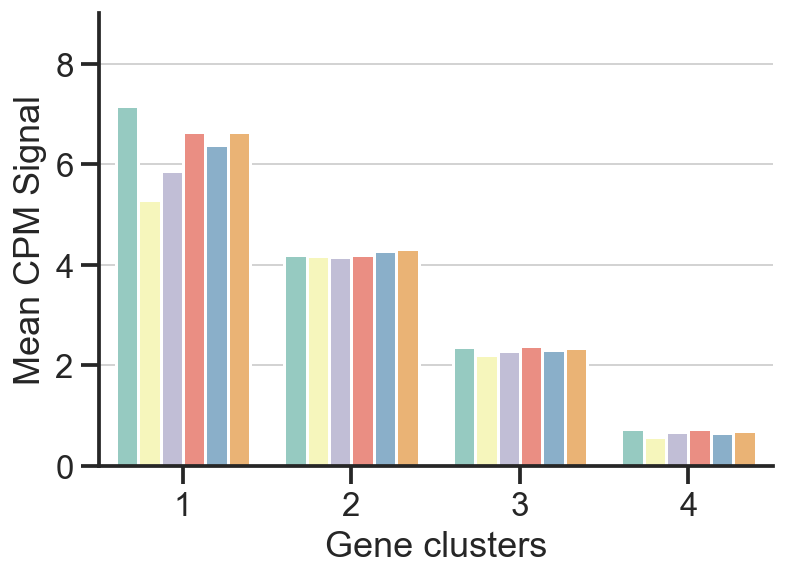

In [34]:
#plt.axhline(9, color = 'lightgrey', linewidth = 1)
plt.axhline(8, color = 'lightgrey', linewidth = 1)
#plt.axhline(7, color = 'lightgrey', linewidth = 1)
plt.axhline(6, color = 'lightgrey', linewidth = 1)
#plt.axhline(5, color = 'lightgrey', linewidth = 1)
plt.axhline(4, color = 'lightgrey', linewidth = 1)
#plt.axhline(3, color = 'lightgrey', linewidth = 1)
plt.axhline(2, color = 'lightgrey', linewidth = 1)
sns.barplot(data=tablek27_final,x='cluster',y='value',hue='condition',palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([0,9])
plt.xlabel('Gene clusters')
plt.ylabel('Mean CPM Signal')



Text(0, 0.5, 'Percentage H3K27me3 Reads')

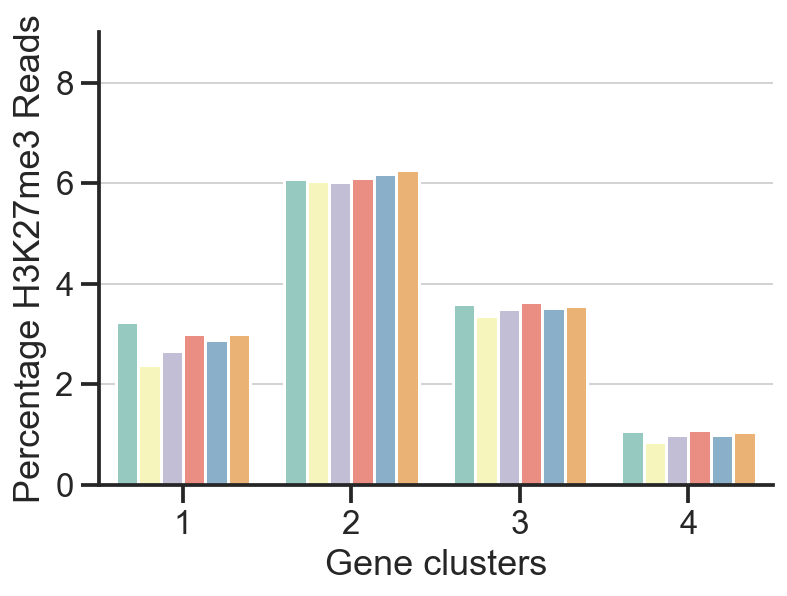

In [35]:
#plt.axhline(9, color = 'lightgrey', linewidth = 1)
plt.axhline(8, color = 'lightgrey', linewidth = 1)
#plt.axhline(7, color = 'lightgrey', linewidth = 1)
plt.axhline(6, color = 'lightgrey', linewidth = 1)
#plt.axhline(5, color = 'lightgrey', linewidth = 1)
plt.axhline(4, color = 'lightgrey', linewidth = 1)
#plt.axhline(3, color = 'lightgrey', linewidth = 1)
plt.axhline(2, color = 'lightgrey', linewidth = 1)
#plt.axhline(1, color = 'lightgrey', linewidth = 1)
sns.barplot(data=k27_clusters,x='id',y='percentage',hue='sample',palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([0,9])
plt.xlabel('Gene clusters')
plt.ylabel('Percentage H3K27me3 Reads')

Text(0, 0.5, 'Percentage H3K27me3 Reads')

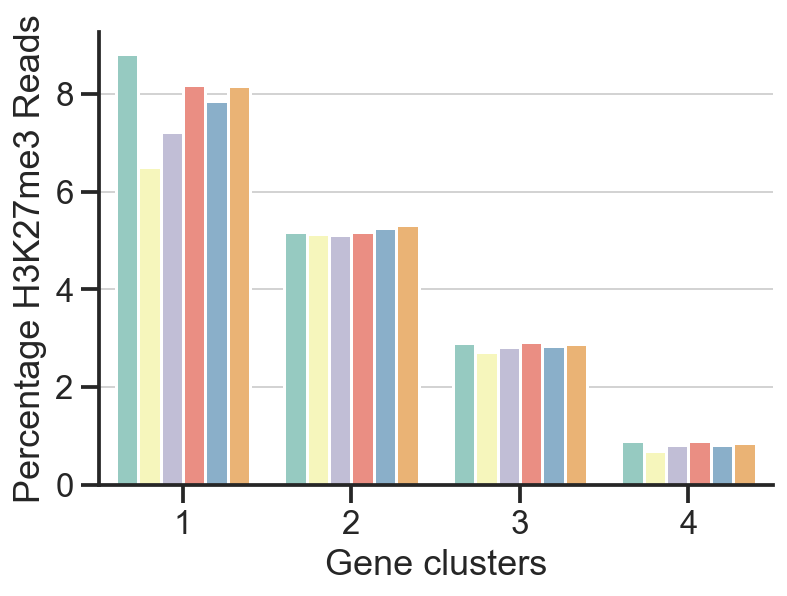

In [36]:
#plt.axhline(9, color = 'lightgrey', linewidth = 1)
plt.axhline(8, color = 'lightgrey', linewidth = 1)
#plt.axhline(7, color = 'lightgrey', linewidth = 1)
plt.axhline(6, color = 'lightgrey', linewidth = 1)
#plt.axhline(5, color = 'lightgrey', linewidth = 1)
plt.axhline(4, color = 'lightgrey', linewidth = 1)
#plt.axhline(3, color = 'lightgrey', linewidth = 1)
plt.axhline(2, color = 'lightgrey', linewidth = 1)
#plt.axhline(1, color = 'lightgrey', linewidth = 1)
sns.barplot(data=k27b_clusters,x='id',y='percentage',hue='sample',
            palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)
#plt.ylim([0,9])
plt.xlabel('Gene clusters')
plt.ylabel('Percentage H3K27me3 Reads')

Text(0, 0.5, 'Norm H3K27me3 Reads')

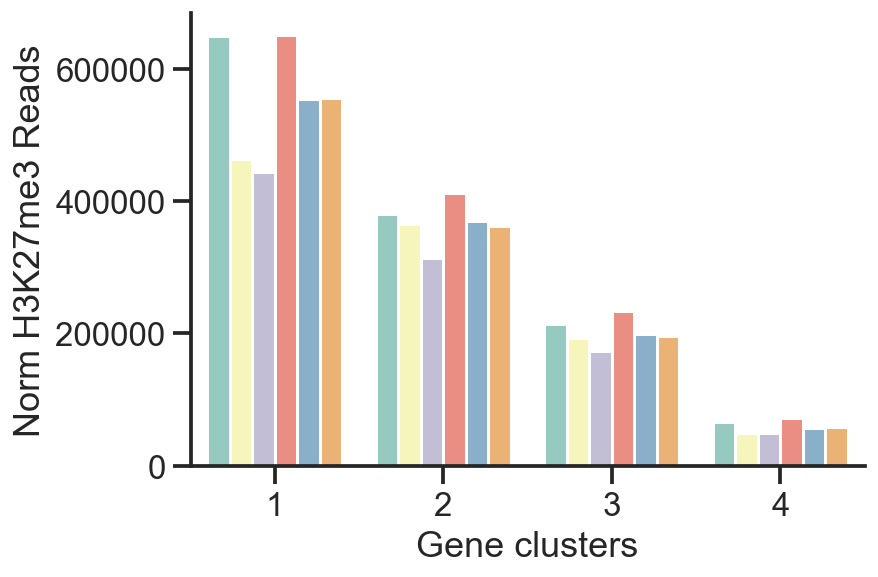

In [37]:
sns.barplot(data=k27b_clusters,x='id',y='norm',hue='sample',
            palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)
#plt.ylim([0,9])
plt.xlabel('Gene clusters')
plt.ylabel('Norm H3K27me3 Reads')

Text(0, 0.5, 'Percentage  H3K27me3 Reads')

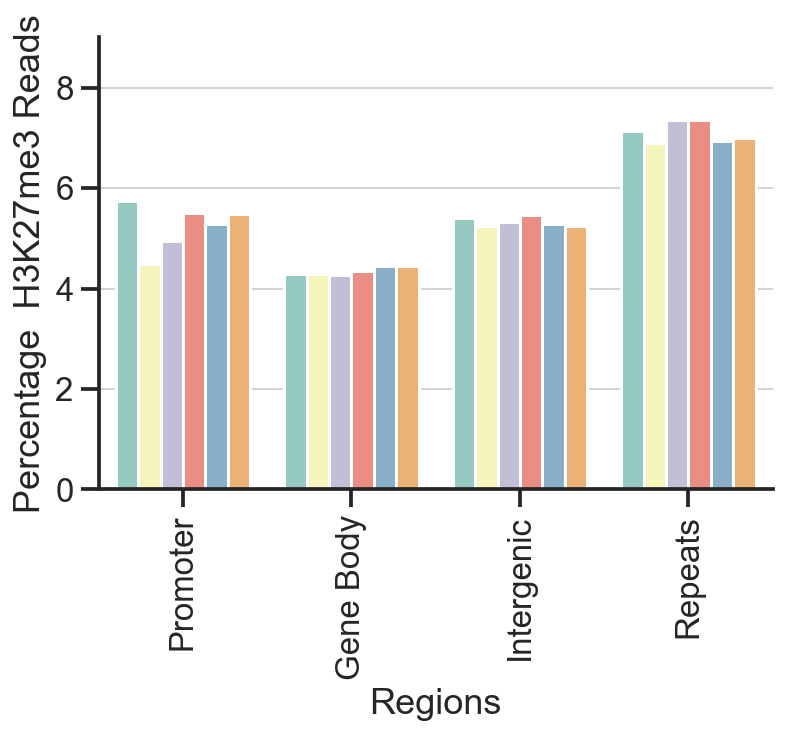

In [38]:
#plt.axhline(9, color = 'lightgrey', linewidth = 1)
plt.axhline(8, color = 'lightgrey', linewidth = 1)
#plt.axhline(7, color = 'lightgrey', linewidth = 1)
plt.axhline(6, color = 'lightgrey', linewidth = 1)
#plt.axhline(5, color = 'lightgrey', linewidth = 1)
plt.axhline(4, color = 'lightgrey', linewidth = 1)
#plt.axhline(3, color = 'lightgrey', linewidth = 1)
plt.axhline(2, color = 'lightgrey', linewidth = 1)
#plt.axhline(1, color = 'lightgrey', linewidth = 1)
sns.barplot(data=k27_regions,x='id',y='percentage',hue='sample',palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([0,9])
plt.xticks(rotation=90)
plt.xlabel('Regions')
plt.ylabel('Percentage  H3K27me3 Reads')

In [209]:
newtable = pd.read_csv('chic_countdf_regions_tpm_normalized.tsv',sep = '\t')
newtable

,promoter,genebody,intergenic,repeats
MB-mESCs-ChICK27me3-con1.bam,138290.883420,230014.157697,317322.167153,314372.791730
MB-mESCs-ChICK27me3-con2.bam,130943.063867,259090.758628,322466.318143,287499.859362
MB-mESCs-ChICK27me3-con3.bam,133638.072335,244070.143741,314409.829067,307881.954857
MB-mESCs-ChICK27me3-con4.bam,138208.412486,233764.195386,307236.289931,320791.102197
MB-mESCs-ChICK27me3-con5.bam,137602.894483,248561.624773,315101.409642,298734.071102
MB-mESCs-ChICK27me3-con6.bam,138621.527775,244747.254359,312947.429234,303683.788632


In [200]:
newtable.sum(axis=0)

promoter      8.173049e+05
genebody      1.460248e+06
intergenic    1.889483e+06
repeats       1.832964e+06
dtype: float64

In [201]:
newtable.sum(axis=1)

MB-mESCs-ChICK27me3-con1.bam    1000000.0
MB-mESCs-ChICK27me3-con2.bam    1000000.0
MB-mESCs-ChICK27me3-con3.bam    1000000.0
MB-mESCs-ChICK27me3-con4.bam    1000000.0
MB-mESCs-ChICK27me3-con5.bam    1000000.0
MB-mESCs-ChICK27me3-con6.bam    1000000.0
dtype: float64

In [202]:
stacked_newdf = pd.DataFrame(newtable.stack()).reset_index(level=1).rename(columns={0:'counts','level_1':'id'})
stacked_newdf['sample'] = ['con1','con1','con1','con1',
                           'con2','con2','con2','con2',
                           'con3','con3','con3','con3',
                           'con4','con4','con4','con4',
                           'con5','con5','con5','con5',
                           'con6','con6','con6','con6']

Text(0, 0.5, 'Percentage  H3K27me3 Reads')

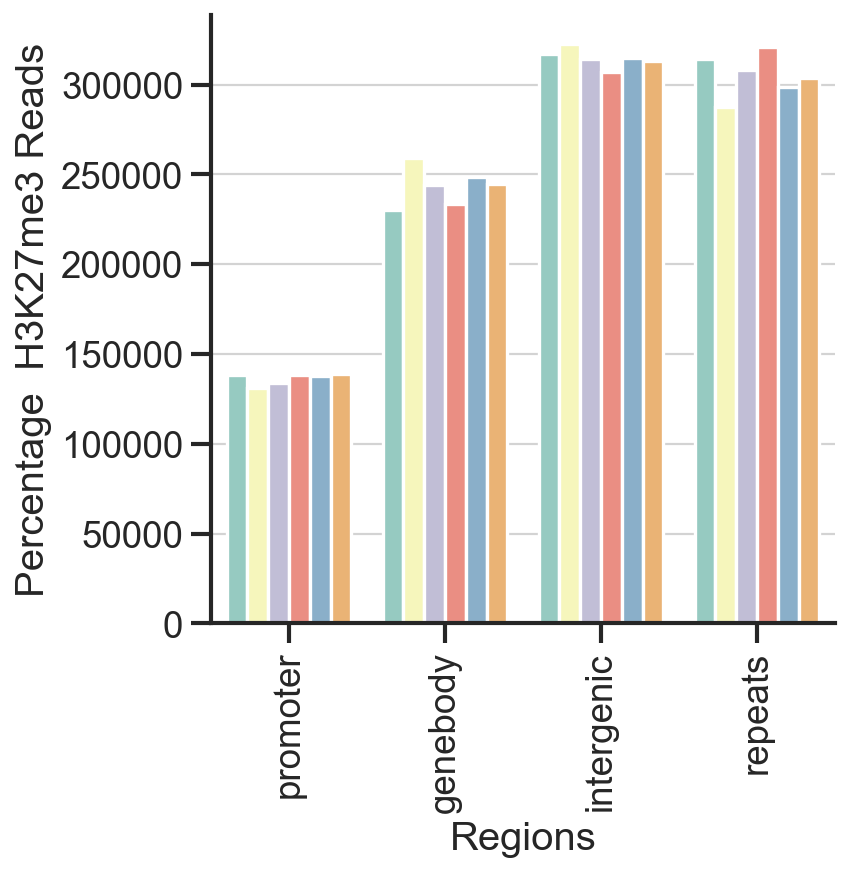

In [210]:

plt.axhline(100000, color = 'lightgrey', linewidth = 1)
plt.axhline(200000, color = 'lightgrey', linewidth = 1)
plt.axhline(300000, color = 'lightgrey', linewidth = 1)
plt.axhline(150000, color = 'lightgrey', linewidth = 1)
plt.axhline(250000, color = 'lightgrey', linewidth = 1)
plt.axhline(50000, color = 'lightgrey', linewidth = 1)


sns.barplot(data=stacked_newdf,x='id',y='counts',hue='sample',palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)

plt.xticks(rotation=90)
plt.xlabel('Regions')
plt.ylabel('Percentage  H3K27me3 Reads')

In [212]:
newtable['sample'] = ['1','2','3','4','5','6']

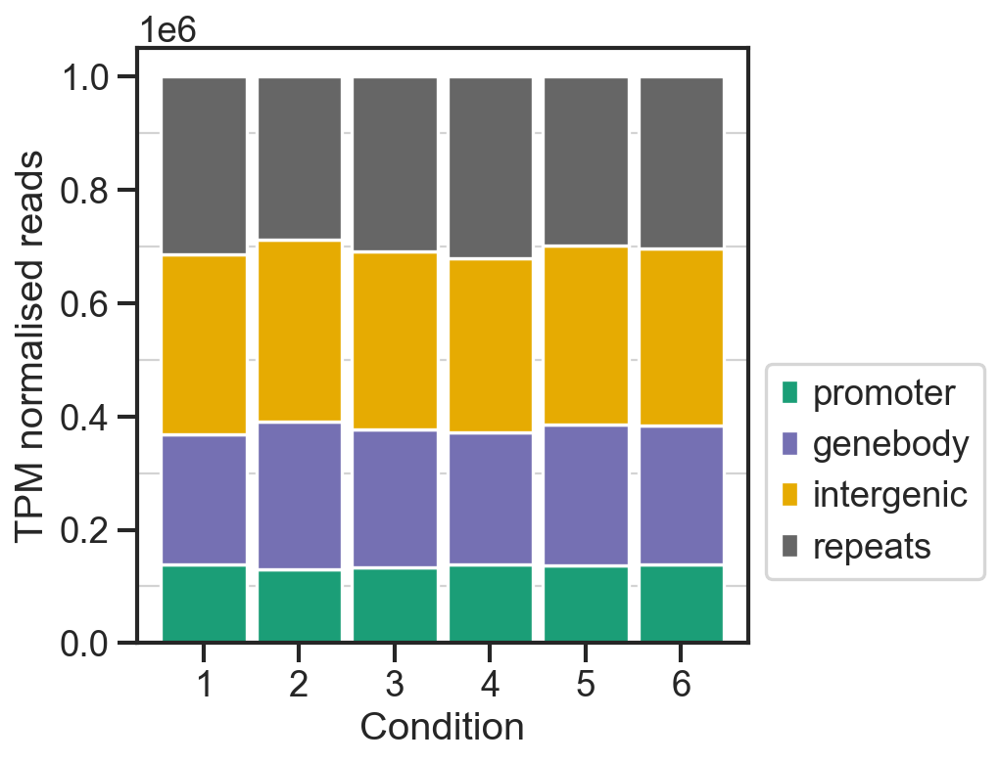

In [216]:
fig,ax = plt.subplots(figsize=(5,5), dpi = 80)
sns.set_style('ticks')
plt.axhline(900000, color = 'lightgrey', linewidth = 1)
ax.axhline(700000, color = 'lightgrey', linewidth = 1)
#plt.axhline(7, color = 'lightgrey', linewidth = 1)
ax.axhline(500000, color = 'lightgrey', linewidth = 1)
#plt.axhline(5, color = 'lightgrey', linewidth = 1)
ax.axhline(300000, color = 'lightgrey', linewidth = 1)
#plt.axhline(3, color = 'lightgrey', linewidth = 1)
ax.axhline(100000, color = 'lightgrey', linewidth = 1)
#plt.axhline(1, color = 'lightgrey', linewidth = 1)
ax = newtable.plot(kind = 'bar', x = 'sample', stacked=True,ax=ax, cmap = 'Dark2',zorder=2,width = 0.9)
ax.tick_params(axis='x',rotation=0)
ax.set_ylabel('TPM normalised reads')
ax.set_xlabel('Condition')
ax.legend(bbox_to_anchor = [1,0.5])

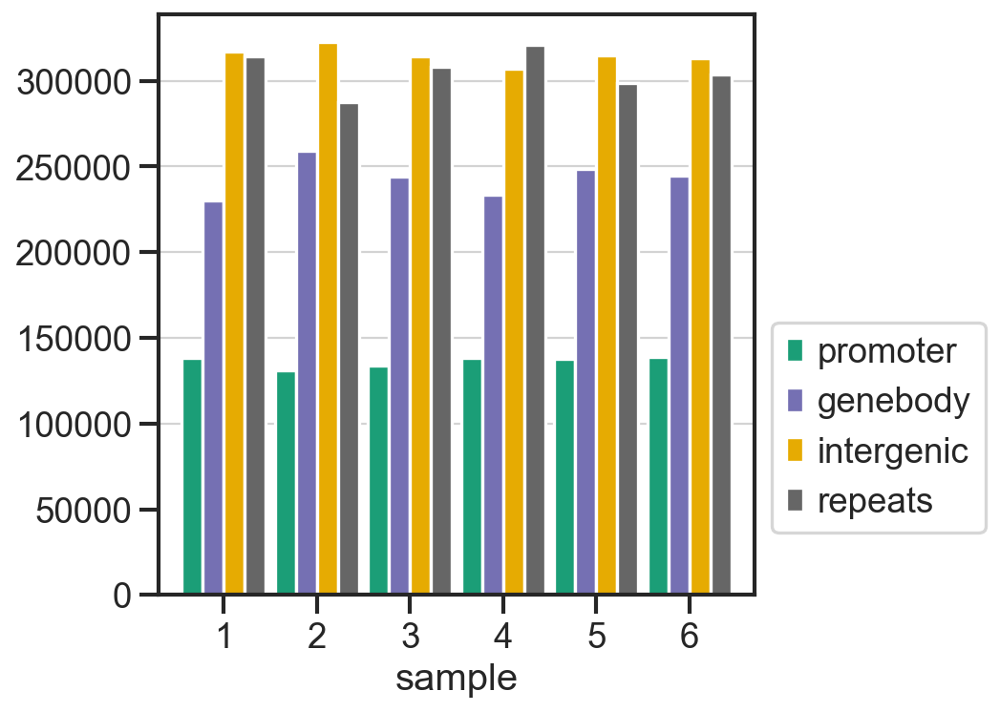

In [213]:
fig,ax = plt.subplots(figsize=(5,5), dpi = 80)
sns.set_style('ticks')
plt.axhline(250000, color = 'lightgrey', linewidth = 1)
ax.axhline(200000, color = 'lightgrey', linewidth = 1)
#plt.axhline(7, color = 'lightgrey', linewidth = 1)
ax.axhline(300000, color = 'lightgrey', linewidth = 1)
#plt.axhline(5, color = 'lightgrey', linewidth = 1)
ax.axhline(150000, color = 'lightgrey', linewidth = 1)
#plt.axhline(3, color = 'lightgrey', linewidth = 1)
ax.axhline(100000, color = 'lightgrey', linewidth = 1)
#plt.axhline(1, color = 'lightgrey', linewidth = 1)
ax = newtable.plot(kind = 'bar', x = 'sample', stacked=False,ax=ax, cmap = 'Dark2',zorder=2,width = 0.9)
ax.tick_params(axis='x',rotation=0)
ax.legend(bbox_to_anchor = [1,0.5])

In [145]:
newtable.T

,MB-mESCs-ChICK27me3-con1.bam,MB-mESCs-ChICK27me3-con2.bam,MB-mESCs-ChICK27me3-con3.bam,MB-mESCs-ChICK27me3-con4.bam,MB-mESCs-ChICK27me3-con5.bam,MB-mESCs-ChICK27me3-con6.bam
promoter,138290.88342,130943.063867,133638.072335,138208.412486,137602.894483,138621.527775
genebody,230014.157697,259090.758628,244070.143741,233764.195386,248561.624773,244747.254359
intergenic,317322.167153,322466.318143,314409.829067,307236.289931,315101.409642,312947.429234
repeats,314372.79173,287499.859362,307881.954857,320791.102197,298734.071102,303683.788632
sample,1,2,3,4,5,6


# check transcriptome

In [146]:
pathToData = '/Users/m.blotenburg/Documents/Projects/Lianne/data/'

In [147]:
file = pathToData + '/dataframes/20230124_adata_dataset_ESC_all.h5ad'  # the file that will store the analysis results

adata = sc.read_h5ad(file)
adata

AnnData object with n_obs × n_vars = 4147 × 24136
    obs: 'n_counts', 'n_genes', 'percent_mito', 'S_score', 'G2M_score', 'phase', 'batch', 'name', 'condition', 'plate', 'leiden'
    var: 'ensembl', 'chromosome', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'batch_colors', 'condition_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'plate_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [148]:
adata.obs

,n_counts,n_genes,percent_mito,S_score,G2M_score,phase,batch,name,condition,plate,leiden
e1_1.m-ESC_con1,7306.0,3604,0.068478,0.024311,0.121200,G2M,m-ESC,m-ESC_con1,con1,e1,2
e1_10.m-ESC_con1,9948.0,4020,0.032744,0.075215,0.022867,S,m-ESC,m-ESC_con1,con1,e1,2
e1_101.m-ESC_con1,12055.0,5011,0.052057,0.021817,0.110170,G2M,m-ESC,m-ESC_con1,con1,e1,2
e1_102.m-ESC_con1,8330.0,3877,0.091631,0.046089,0.106339,G2M,m-ESC,m-ESC_con1,con1,e1,2
e1_103.m-ESC_con1,3257.0,2232,0.094175,0.043077,0.060849,G2M,m-ESC,m-ESC_con1,con1,e1,2
...,...,...,...,...,...,...,...,...,...,...,...
e12_95.m-ESC_con6,6510.0,3359,0.055492,0.055952,0.037900,S,m-ESC,m-ESC_con6,con6,e12,0
e12_96.m-ESC_con6,8046.0,3834,0.005440,0.026168,0.120394,G2M,m-ESC,m-ESC_con6,con6,e12,0
e12_97.m-ESC_con6,2982.0,2000,0.070913,0.064887,0.045792,S,m-ESC,m-ESC_con6,con6,e12,5
e12_98.m-ESC_con6,6122.0,3231,0.008952,0.061465,0.009357,S,m-ESC,m-ESC_con6,con6,e12,0


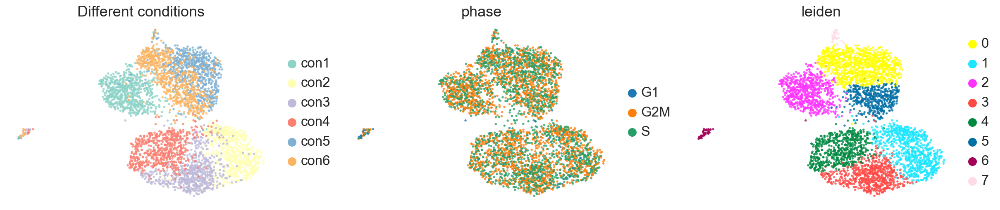

In [149]:

ax=sc.pl.umap(adata, color=['condition','phase','leiden'], size=30, frameon=False, alpha=0.8, 
              title = 'Different conditions')

In [150]:
conversion_table = singlecellmultiomics.bamProcessing.bamToRNACounts.get_gene_id_to_gene_name_conversion_table('/Users/m.blotenburg/Documents/Projects/Helena/standard_files/exons.gtf.gz')
table['genes'] = np.array([conversion_table.get(x,x) for x in table['ensembl']])
cluster1 = list(table[table['deepTools_group'] =='cluster_1']['genes'])
cluster2 = list(table[table['deepTools_group'] =='cluster_2']['genes'])
cluster3 = list(table[table['deepTools_group'] =='cluster_3']['genes'])
cluster4 = list(table[table['deepTools_group'] =='cluster_4']['genes'])
allgenes = list(table['genes'])

print(len(cluster1), len(cluster1)/len(allgenes))
print(len(cluster2), len(cluster2)/len(allgenes))
print(len(cluster3), len(cluster3)/len(allgenes))
print(len(cluster4), len(cluster4)/len(allgenes))
print(len(allgenes), len(allgenes)/len(allgenes))

7983 0.1620255733712198
11065 0.22457885122792776
16206 0.3289222650700223
14016 0.2844733103308301
49270 1.0


In [151]:
c1 = pd.DataFrame([cluster1]).T
c1['cluster'] = 'cluster1'
c2 = pd.DataFrame([cluster2]).T
c2['cluster'] = 'cluster2'
c3 = pd.DataFrame([cluster3]).T
c3['cluster'] = 'cluster3'
c4 = pd.DataFrame([cluster4]).T
c4['cluster'] = 'cluster4'

all_clusters = pd.concat([c1,c2,c3,c4])
all_clusters.index = all_clusters[0]
all_clusters

,0,cluster
0,,
Gm3242,Gm3242,cluster1
Gm3667,Gm3667,cluster1
Tfap2b,Tfap2b,cluster1
5033428I22Rik,5033428I22Rik,cluster1
Gm34030,Gm34030,cluster1
...,...,...
Gm11473,Gm11473,cluster4
ENSMUSG00000117824,ENSMUSG00000117824,cluster4
Vmn2r33,Vmn2r33,cluster4


In [152]:
all_clusters['cluster']
all_clusters = all_clusters[~all_clusters.index.duplicated(keep='first')]
adata.var['clusters'] = all_clusters['cluster']
adata.var

,ensembl,chromosome,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std,clusters
Mrpl15,ENSMUSG00000033845,1,3552,False,0.169399,-1.851475,0.262761,-1.184679e-11,0.125496,cluster4
Lypla1,ENSMUSG00000025903,1,3528,False,0.180757,-1.924197,0.048336,9.421725e-13,0.129145,cluster4
Tcea1,ENSMUSG00000033813,1,2551,True,0.065466,-2.011821,0.676373,6.437038e-11,0.079397,cluster4
Atp6v1h,ENSMUSG00000033793,1,3126,False,0.107633,-2.218342,-0.964794,-1.070866e-11,0.092329,cluster2
Rb1cc1,ENSMUSG00000025907,1,2234,False,0.047219,-2.431601,-0.073139,8.732640e-12,0.057748,cluster3
...,...,...,...,...,...,...,...,...,...,...
Gm22365,ENSMUSG00000070263,19,3,False,0.000048,-2.677573,-0.512319,5.505888e-13,0.001754,cluster3
Gm5269,ENSMUSG00000098549,1,2,False,0.000062,-1.544656,1.510491,-5.940169e-13,0.003273,cluster2
Gm37924,ENSMUSG00000102482,3,2,False,0.000020,-3.172641,-1.396258,3.797494e-13,0.000901,cluster3
Olfr1350,ENSMUSG00000056696,7,2,False,0.000014,-3.540519,-2.053100,-3.743840e-13,0.000627,cluster2


In [153]:
adata1 = adata[adata.obs['condition'] == 'con1']
adata2 = adata[adata.obs['condition'] == 'con2']
adata3 = adata[adata.obs['condition'] == 'con3']
adata4 = adata[adata.obs['condition'] == 'con4']
adata5 = adata[adata.obs['condition'] == 'con5']
adata6 = adata[adata.obs['condition'] == 'con6']

/Users/m.blotenburg/miniconda3/envs/multiconda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

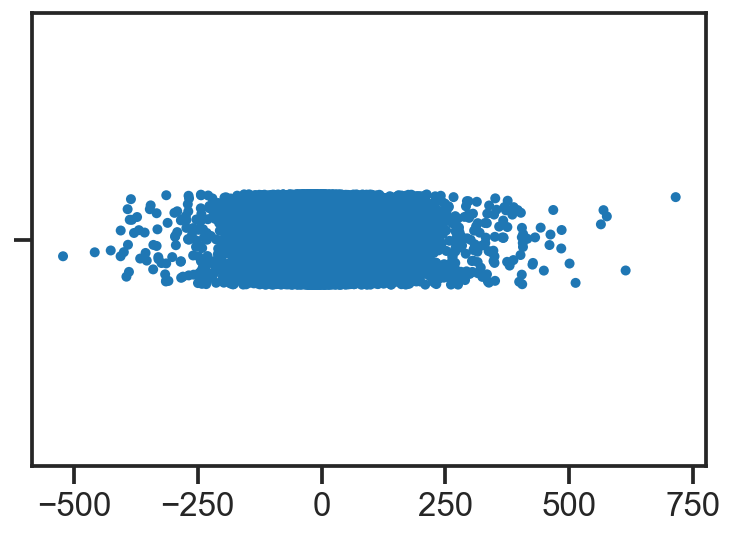

In [154]:
sns.stripplot(adata1.X.sum(axis=0))

/Users/m.blotenburg/miniconda3/envs/multiconda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

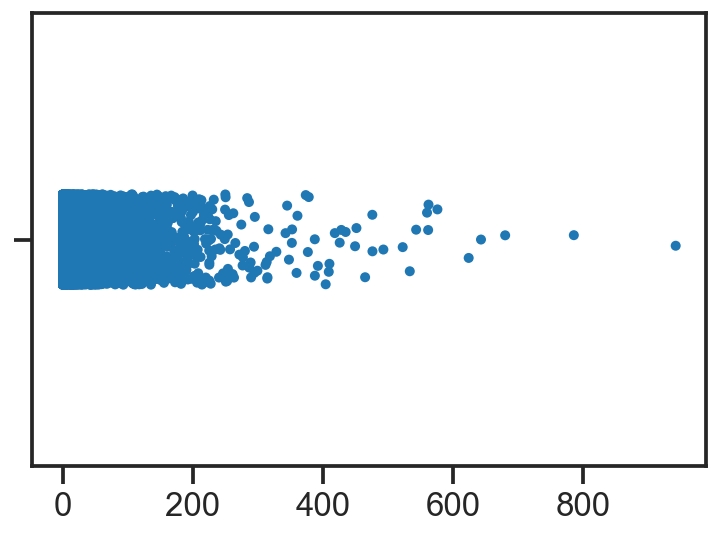

In [155]:
sns.stripplot(adata1.raw.X.sum(axis=0))

In [156]:
adata1.var['counts'] = adata1.raw.X.sum(axis=0)
adata1.var['meancounts'] = adata1.raw.X.mean(axis=0)
sum1 = adata1.var[['clusters','counts','meancounts']]
sum1['condition'] = '1'

adata2.var['counts'] = adata2.raw.X.sum(axis=0)
adata2.var['meancounts'] = adata2.raw.X.mean(axis=0)
sum2 = adata2.var[['clusters','counts','meancounts']]
sum2['condition'] = '2'

adata3.var['counts'] = adata3.raw.X.sum(axis=0)
adata3.var['meancounts'] = adata3.raw.X.mean(axis=0)
sum3 = adata3.var[['clusters','counts','meancounts']]
sum3['condition'] = '3'

adata4.var['counts'] = adata4.raw.X.sum(axis=0)
adata4.var['meancounts'] = adata4.raw.X.mean(axis=0)
sum4 = adata4.var[['clusters','counts','meancounts']]
sum4['condition'] = '4'

adata5.var['counts'] = adata5.raw.X.sum(axis=0)
adata5.var['meancounts'] = adata5.raw.X.mean(axis=0)
sum5 = adata5.var[['clusters','counts','meancounts']]
sum5['condition'] = '5'

adata6.var['counts'] = adata6.raw.X.sum(axis=0)
adata6.var['meancounts'] = adata6.raw.X.mean(axis=0)
sum6 = adata6.var[['clusters','counts','meancounts']]
sum6['condition'] = '6'

sum_all = pd.concat([sum1,sum2,sum3,sum4,sum5,sum6])
sum_all['clusters'] = sum_all['clusters'].fillna('x')


/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/3460411581.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata1.var['counts'] = adata1.raw.X.sum(axis=0)
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/3460411581.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sum1['condition'] = '1'
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/3460411581.py:6: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata2.var['counts'] = adata2.raw.X.sum(axis=0)
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/3460411581.py:9: SettingWithCopyWarning: 
A value is trying to be set on a co

In [157]:
sum_all

,clusters,counts,meancounts,condition
Mrpl15,cluster4,102.522980,0.146881,1
Lypla1,cluster4,92.763748,0.132899,1
Tcea1,cluster4,54.572460,0.078184,1
Atp6v1h,cluster2,77.595085,0.111168,1
Rb1cc1,cluster3,37.905781,0.054306,1
...,...,...,...,...
Gm22365,cluster3,0.066549,0.000100,6
Gm5269,cluster2,0.233530,0.000351,6
Gm37924,cluster3,0.082056,0.000123,6
Olfr1350,cluster2,0.057063,0.000086,6


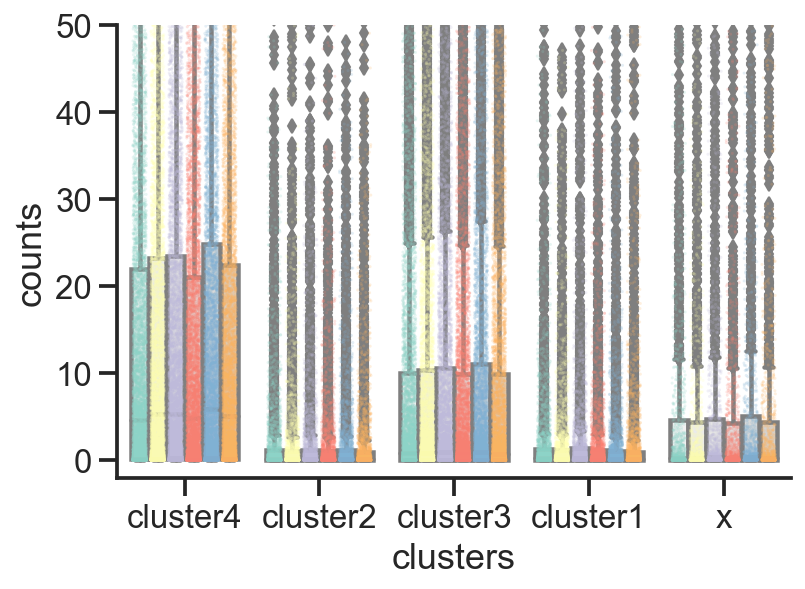

In [158]:
sns.boxplot(data = sum_all, x = 'clusters', y = 'counts', hue = 'condition', dodge = True, color = 'lightgrey')
sns.stripplot(data = sum_all, x = 'clusters', y = 'counts', hue = 'condition', dodge = True, palette = 'Set3',size = 1.5,alpha = 0.2, jitter = 0.3)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([-2,50])
plt.show()

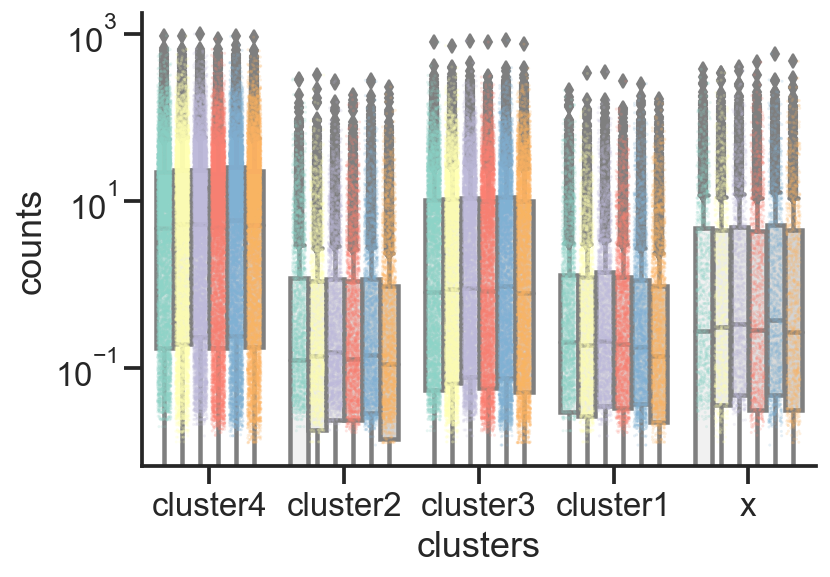

In [159]:
sns.boxplot(data = sum_all, x = 'clusters', y = 'counts', hue = 'condition', dodge = True, color = 'lightgrey')
sns.stripplot(data = sum_all, x = 'clusters', y = 'counts', hue = 'condition', dodge = True, palette = 'Set3',size = 1.5,alpha = 0.2, jitter = 0.3)
sns.despine()
plt.legend([],frameon=False)
plt.yscale('log')
plt.show()

In [160]:
sum_all['logcounts'] = np.log10(sum_all['counts'])
sum_all['logmeancounts'] = np.log10(sum_all['meancounts'])


/Users/m.blotenburg/miniconda3/envs/multiconda/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/m.blotenburg/miniconda3/envs/multiconda/lib/python3.8/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [161]:
sum_all = sum_all[sum_all['counts'] != 0.0]

counts


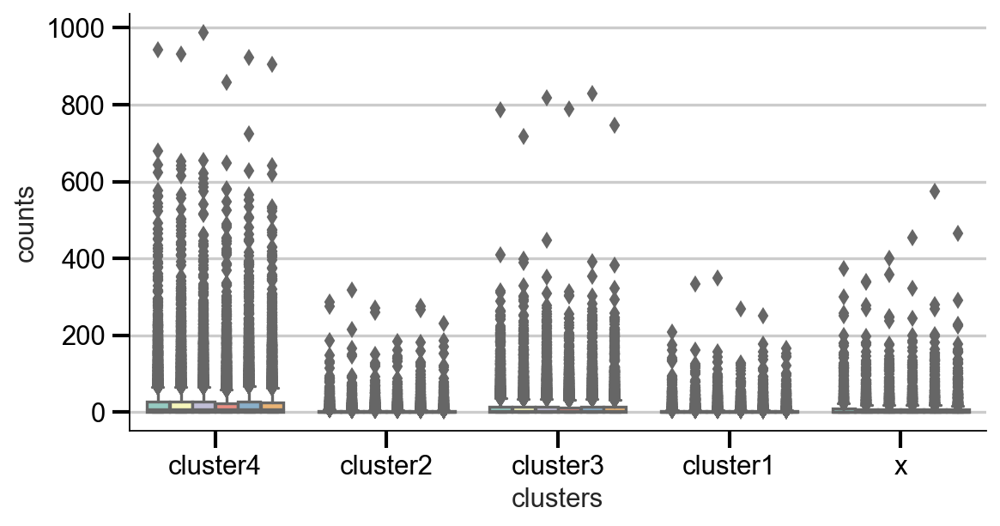

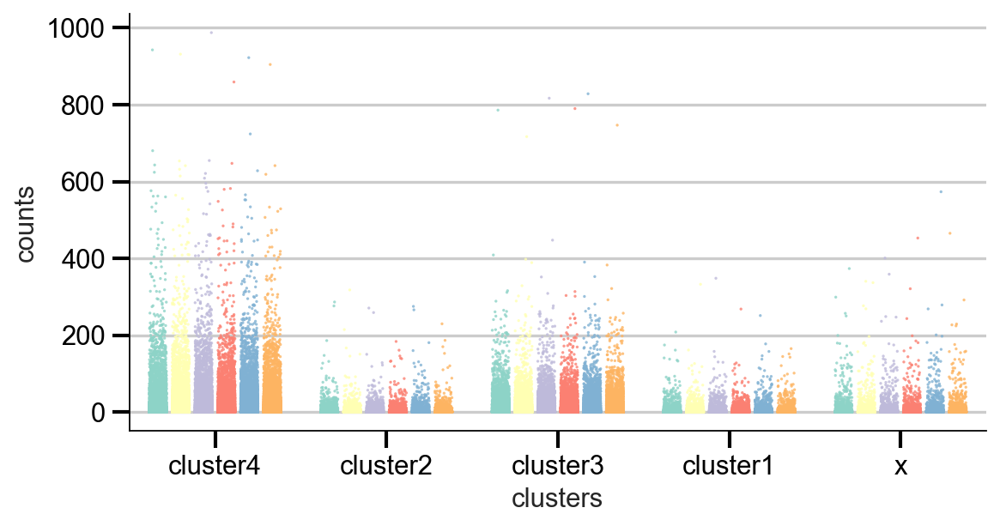

logcounts


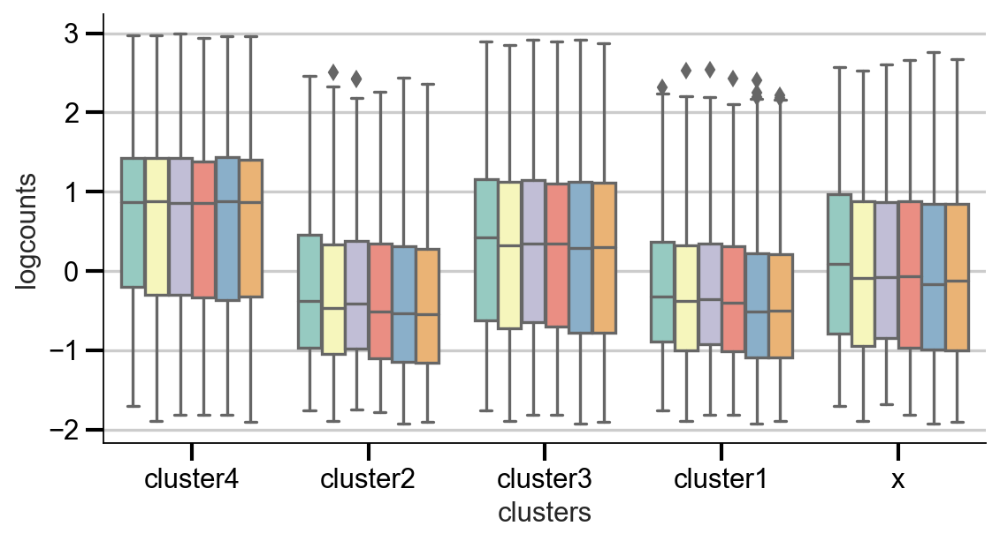

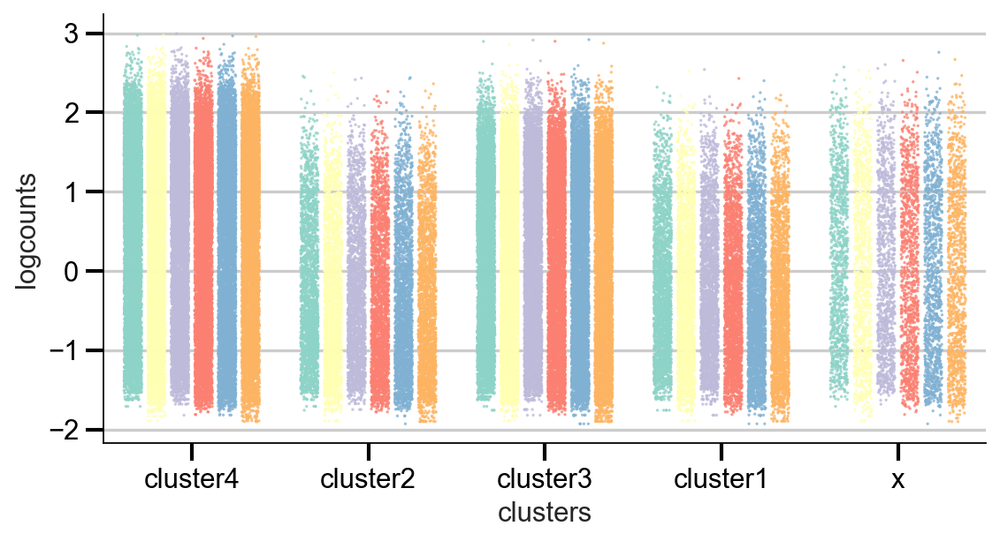

meancounts


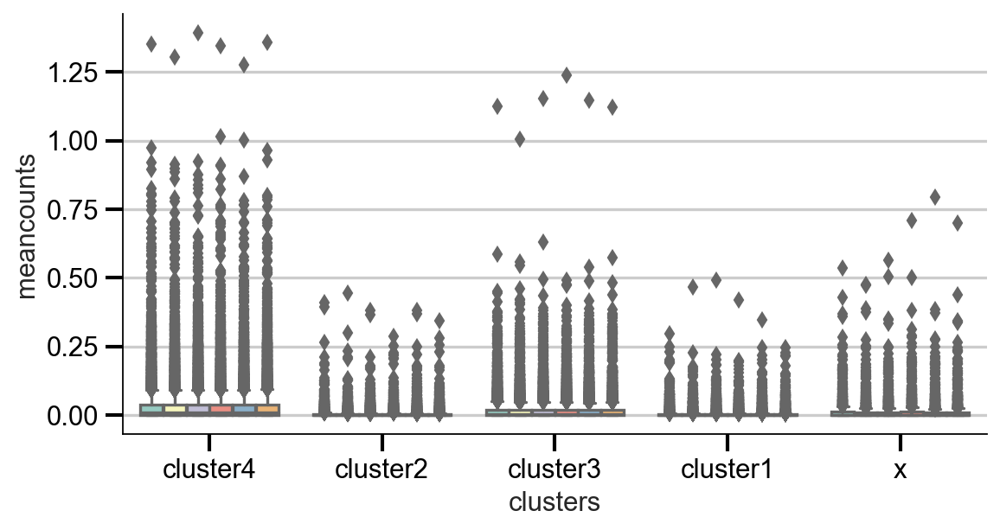

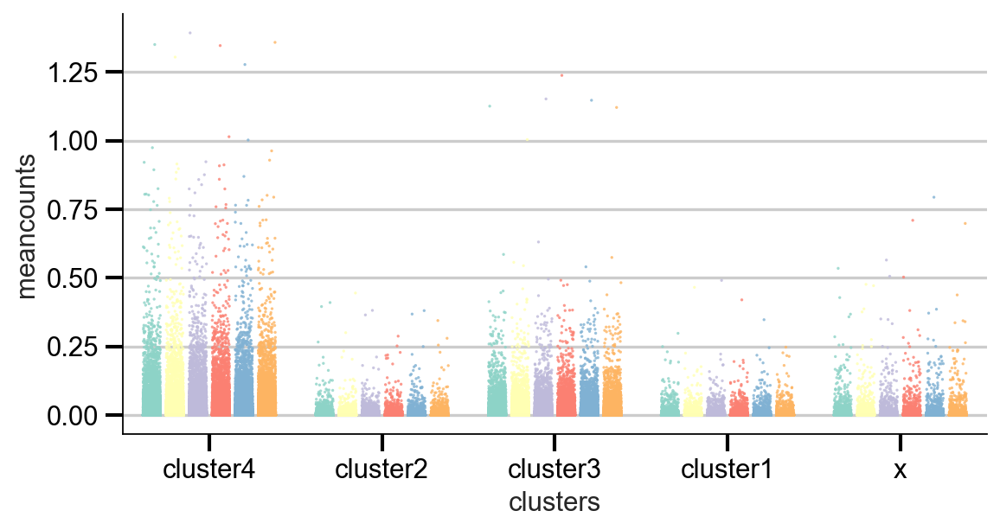

logmeancounts


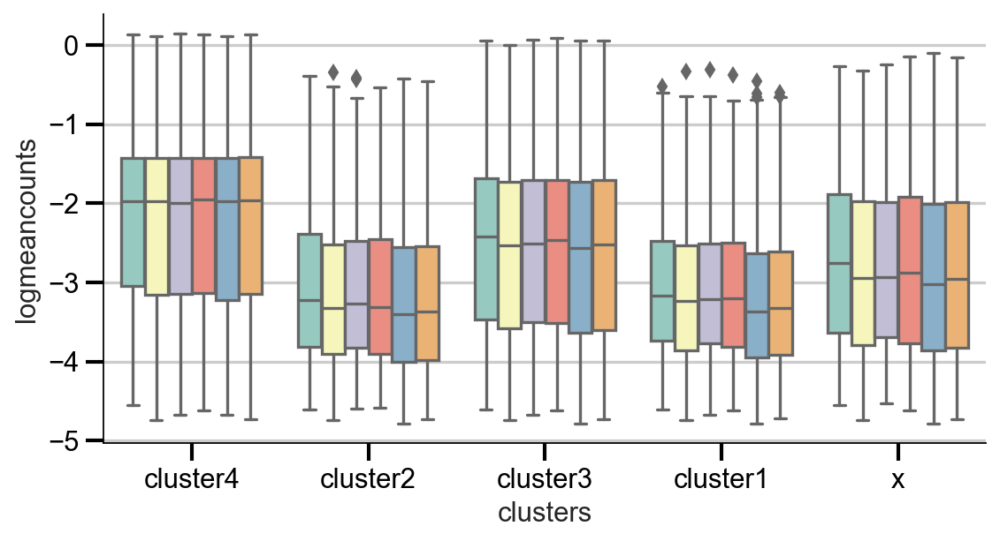

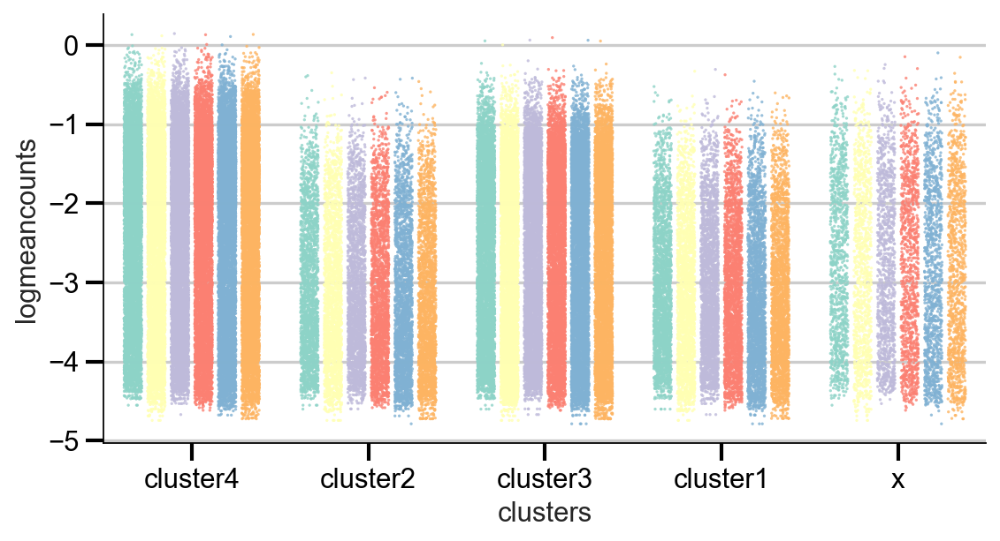

In [163]:
sc.set_figure_params(dpi = 80,figsize = (8,4))

all_counts = ['counts','logcounts','meancounts','logmeancounts']

for count in all_counts:
    print(count)
    sns.boxplot(data = sum_all, x = 'clusters', y = count, hue = 'condition', dodge = True, palette = 'Set3')
    sns.despine()
    plt.legend([],frameon=False)
    plt.show()
    
    sns.stripplot(data = sum_all, x = 'clusters', y = count, hue = 'condition', dodge = True,size = 1.5,alpha = 0.8, jitter = 0.3, palette = 'Set3')
    sns.despine()
    plt.legend([],frameon=False)
    plt.show()

In [164]:
sum_all.sort_values(by='counts')

,clusters,counts,meancounts,condition,logcounts,logmeancounts
Ces1b,cluster1,0.011801,0.000016,5,-1.928094,-4.786631
Gm46409,cluster3,0.011801,0.000016,5,-1.928094,-4.786631
Gm8517,cluster2,0.011801,0.000016,5,-1.928094,-4.786631
4930401A07Rik,cluster3,0.011801,0.000016,5,-1.928094,-4.786631
Chst7,x,0.011801,0.000016,5,-1.928094,-4.786631
...,...,...,...,...,...,...
Hsp90ab1,cluster4,904.617981,1.358285,6,2.956465,0.132991
Hsp90ab1,cluster4,922.404663,1.277569,5,2.964921,0.106384
Hsp90ab1,cluster4,931.501953,1.304625,2,2.969184,0.115486
Hsp90ab1,cluster4,942.602600,1.350433,1,2.974329,0.130473


In [165]:
pathToAdata = '/Users/m.blotenburg/Documents/Projects/Lianne/2022_Exp_Marloes/jupyter_notebooks/20230403dataset120hAA.h5ad'
adata_g = sc.read(pathToAdata)

In [166]:
adata_g.obs

,n_counts,n_genes,percent_mito,S_score,G2M_score,phase,condition,gastruloid,plate,condition_gastruloid,leiden,celltype
1_1.Gast_con6_D1,16560.0,5946,0.043137,0.037635,0.002132,S,con6,D1,1,con6_D1,0,Presomitic Mesoderm
1_10.Gast_con6_D1,17961.0,5993,0.044856,0.017974,0.047524,G2M,con6,D1,1,con6_D1,5,Somitic Mesoderm
1_100.Gast_con6_D1,15319.0,5726,0.052635,0.031866,0.095217,G2M,con6,D1,1,con6_D1,16,PGCs
1_101.Gast_con6_D1,8396.0,4067,0.064930,0.048672,-0.021446,S,con6,D1,1,con6_D1,16,PGCs
1_102.Gast_con6_D1,8089.0,4120,0.041657,0.016486,-0.000207,S,con6,D1,1,con6_D1,12,Endoderm
...,...,...,...,...,...,...,...,...,...,...,...,...
15_93.Gast_con6_H2,7221.0,3890,0.063783,-0.012970,-0.026996,G1,con6,H2,15,con6_H2,3,PGCs
15_94.Gast_con6_H2,4297.0,2631,0.059454,0.016824,-0.031569,S,con6,H2,15,con6_H2,1,Early Somitic
15_95.Gast_con6_H2,6646.0,3505,0.045555,0.057104,-0.017542,S,con6,H2,15,con6_H2,1,Early Somitic
15_96.Gast_con6_H2,10414.0,4592,0.055295,0.012916,0.110735,G2M,con6,H2,15,con6_H2,2,Early Somitic


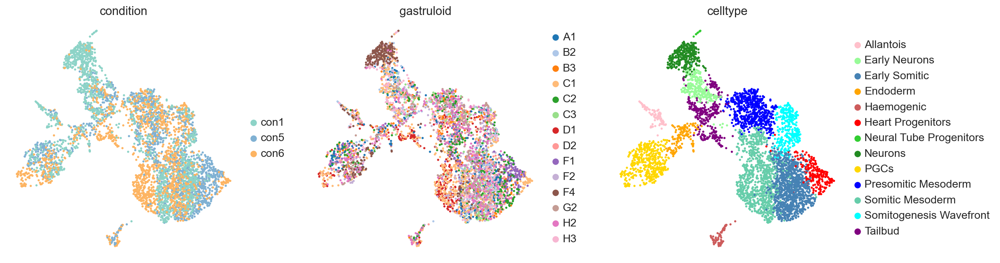

In [167]:
sc.set_figure_params(dpi = 80,figsize = (5,5))

sc.pl.umap(adata_g,color = ['condition','gastruloid','celltype'],frameon=False)

In [168]:
adata_g.var['clusters'] = all_clusters['cluster']

/Users/m.blotenburg/miniconda3/envs/multiconda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

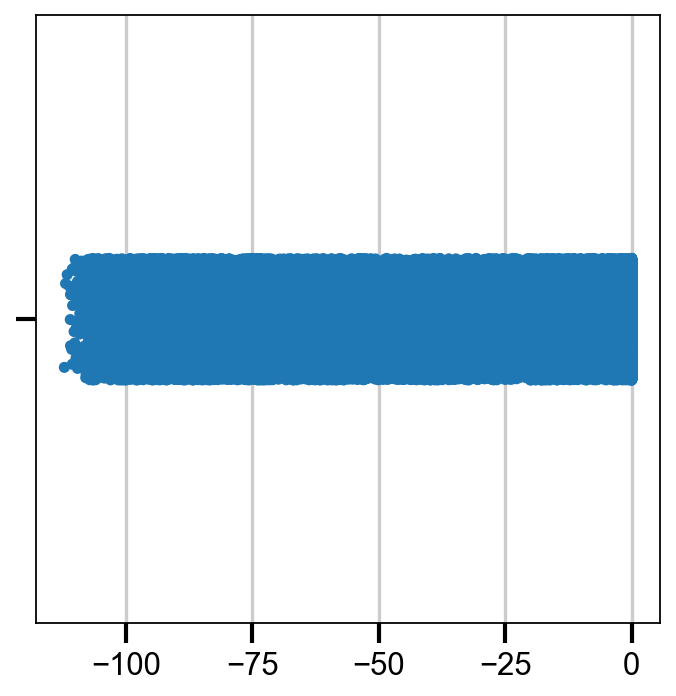

In [169]:
sns.stripplot(adata_g.X.sum(axis=0))

/Users/m.blotenburg/miniconda3/envs/multiconda/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:>

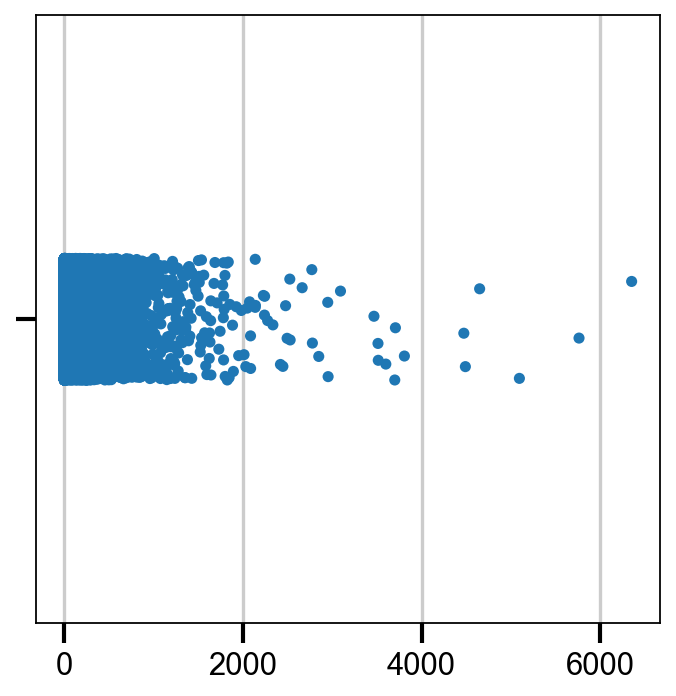

In [170]:
sns.stripplot(adata_g.raw.X.sum(axis=0))

In [171]:
adatag1 = adata_g[adata_g.obs['condition'] == 'con1']
adatag5 = adata_g[adata_g.obs['condition'] == 'con5']
adatag6 = adata_g[adata_g.obs['condition'] == 'con6']

In [172]:
adatag1.var['counts'] = adatag1.raw.X.sum(axis=0)
adatag1.var['meancounts'] = adatag1.raw.X.mean(axis=0)
sumg1 = adatag1.var[['clusters','counts','meancounts']]
sumg1['condition'] = '1'

adatag5.var['counts'] = adatag5.raw.X.sum(axis=0)
adatag5.var['meancounts'] = adatag5.raw.X.mean(axis=0)
sumg5 = adatag5.var[['clusters','counts','meancounts']]
sumg5['condition'] = '5'

adatag6.var['counts'] = adatag6.raw.X.sum(axis=0)
adatag6.var['meancounts'] = adatag6.raw.X.mean(axis=0)
sumg6 = adatag6.var[['clusters','counts','meancounts']]
sumg6['condition'] = '6'

sumg_all = pd.concat([sumg1,sumg5,sumg6])
sumg_all['clusters'] = sumg_all['clusters'].fillna('x')


/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/3460502076.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adatag1.var['counts'] = adatag1.raw.X.sum(axis=0)
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/3460502076.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sumg1['condition'] = '1'
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/3460502076.py:6: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adatag5.var['counts'] = adatag5.raw.X.sum(axis=0)
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/3460502076.py:9: SettingWithCopyWarning: 
A value is trying to be set on

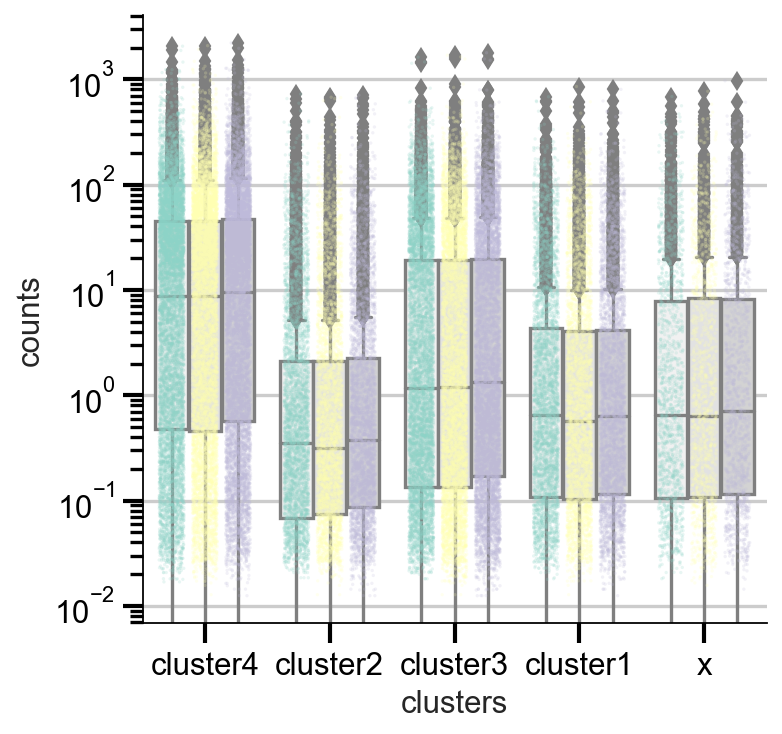

In [173]:
sns.boxplot(data = sumg_all, x = 'clusters', y = 'counts', 
            hue = 'condition', dodge = True, color = 'lightgrey')
sns.stripplot(data = sumg_all, x = 'clusters', y = 'counts', 
              hue = 'condition', dodge = True, palette = 'Set3',
              size = 1.5,alpha = 0.2, jitter = 0.3)
sns.despine()
plt.legend([],frameon=False)
plt.yscale('log')
plt.show()

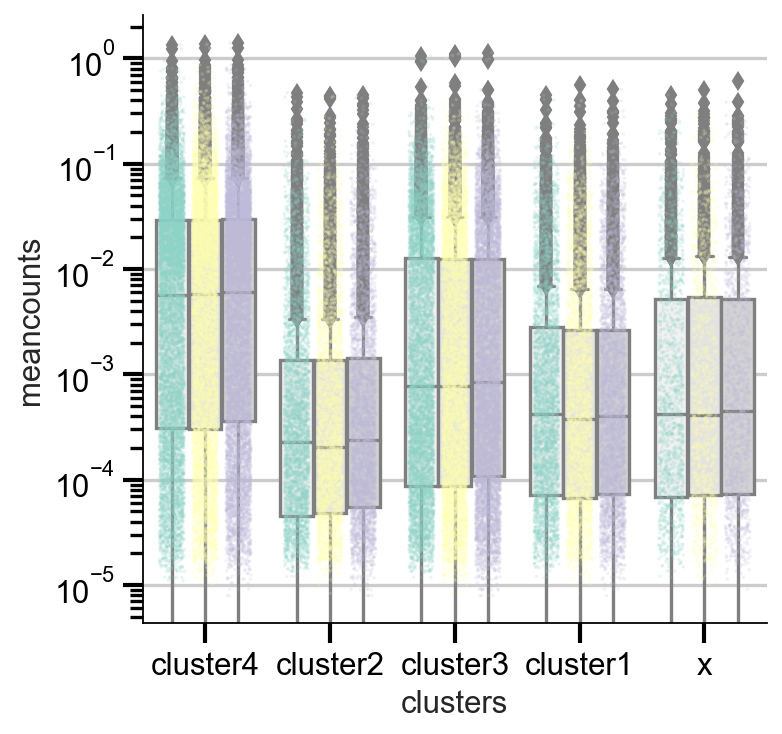

In [174]:
sns.boxplot(data = sumg_all, x = 'clusters', y = 'meancounts', 
            hue = 'condition', dodge = True, color = 'lightgrey')
sns.stripplot(data = sumg_all, x = 'clusters', y = 'meancounts', 
              hue = 'condition', dodge = True, palette = 'Set3',
              size = 1.5,alpha = 0.2, jitter = 0.3)
sns.despine()
plt.legend([],frameon=False)
plt.yscale('log')
plt.show()

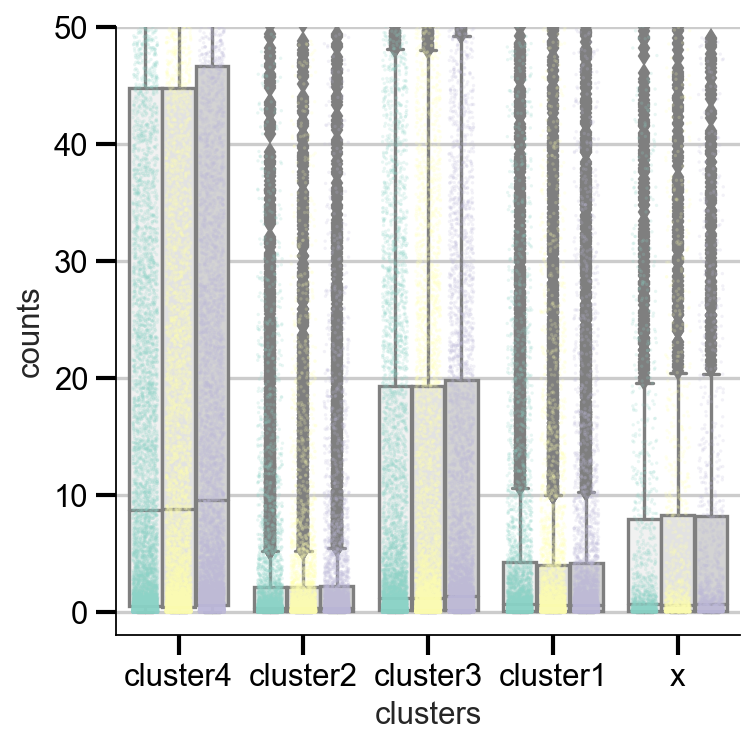

In [175]:
sns.boxplot(data = sumg_all, x = 'clusters', y = 'counts', 
            hue = 'condition', dodge = True, color = 'lightgrey')
sns.stripplot(data = sumg_all, x = 'clusters', y = 'counts', 
              hue = 'condition', dodge = True, palette = 'Set3',
              size = 1.5,alpha = 0.2, jitter = 0.3)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([-2,50])
plt.show()

In [176]:
sumg_all[['counts','condition']].mean()

counts       23.626936
condition          inf
dtype: float64

In [177]:
sumg_avg = sumg_all.groupby(['condition','clusters']).mean()
sumg_avg = sumg_avg.reset_index()
sumg_avg['cluster'] = sumg_avg['clusters']
sumg_avg['cluster'] = sumg_avg['cluster'].str.replace('cluster','')

sumg_avg

,condition,clusters,counts,meancounts,cluster
0,1,cluster1,10.094344,0.006602,1
1,1,cluster2,7.418907,0.004852,2
2,1,cluster3,21.072773,0.013782,3
3,1,cluster4,40.178516,0.026278,4
4,1,x,15.505667,0.010141,x
5,5,cluster1,9.558057,0.006239,1
6,5,cluster2,7.304726,0.004768,2
7,5,cluster3,20.890701,0.013636,3
8,5,cluster4,40.453648,0.026406,4
9,5,x,15.949674,0.010411,x


In [178]:
sum_avg = sum_all.groupby(['condition','clusters']).mean()
sum_avg = sum_avg.reset_index()
sum_avg['cluster'] = sum_avg['clusters']
sum_avg['cluster'] = sum_avg['cluster'].str.replace('cluster','')
sum_avg

,condition,clusters,counts,meancounts,logcounts,logmeancounts,cluster
0,1,cluster1,4.061161,0.005818,-0.218803,-3.062658,1
1,1,cluster2,4.496306,0.006442,-0.227574,-3.071430,2
2,1,cluster3,13.448577,0.019267,0.294391,-2.549464,3
3,1,cluster4,23.851099,0.034171,0.618283,-2.225572,4
4,1,x,11.652882,0.016695,0.110277,-2.733578,x
5,2,cluster1,3.659777,0.005126,-0.298800,-3.152498,1
6,2,cluster2,3.743401,0.005243,-0.325453,-3.179151,2
7,2,cluster3,12.633744,0.017694,0.223212,-2.630486,3
8,2,cluster4,24.102219,0.033757,0.593260,-2.260438,4
9,2,x,10.346970,0.014492,-0.004462,-2.858160,x


In [180]:
sc.settings.set_figure_params(dpi=80, figsize = (5,5))

sns.set_style('ticks')
#sns.set_style('whitegrid')
sns.set_context('talk')

Text(0, 0.5, 'Transcriptome Reads')

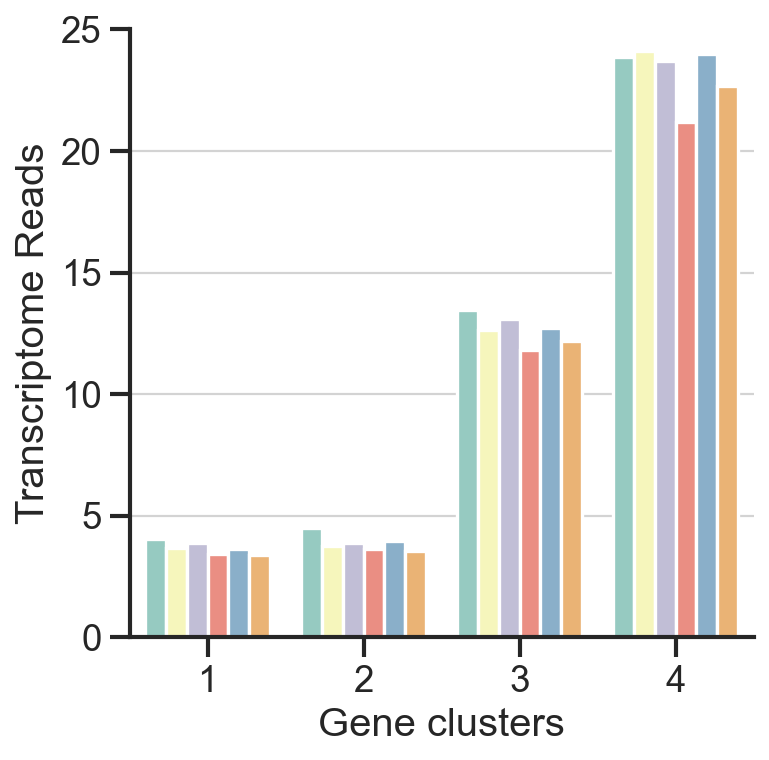

In [181]:
#plt.axhline(9, color = 'lightgrey', linewidth = 1)
plt.axhline(5, color = 'lightgrey', linewidth = 1)
#plt.axhline(7, color = 'lightgrey', linewidth = 1)
plt.axhline(10, color = 'lightgrey', linewidth = 1)
#plt.axhline(5, color = 'lightgrey', linewidth = 1)
plt.axhline(15, color = 'lightgrey', linewidth = 1)
#plt.axhline(3, color = 'lightgrey', linewidth = 1)
plt.axhline(20, color = 'lightgrey', linewidth = 1)
#plt.axhline(25, color = 'lightgrey', linewidth = 1)

sns.barplot(data=sum_avg[sum_avg['cluster'] != 'x'],x='cluster',y='counts',hue='condition',palette='Set3',zorder=2)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([0,25])
#plt.xticks(rotation=90)
plt.xlabel('Gene clusters')
plt.ylabel('Transcriptome Reads')

Text(0, 0.5, 'Transcriptome Reads')

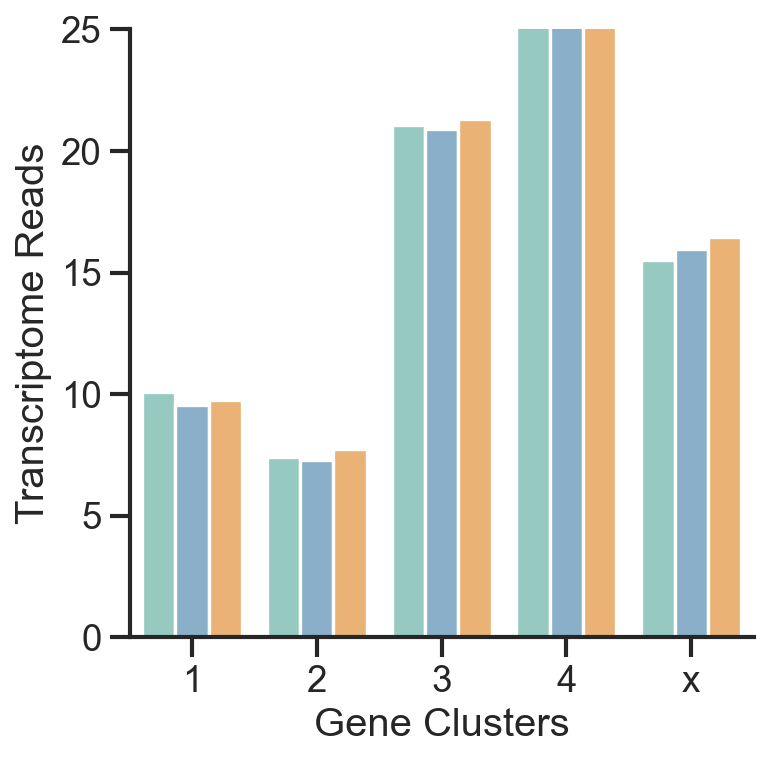

In [182]:
sns.barplot(data=sumg_avg,x='cluster',y='counts',hue='condition',
            palette=['#8dd3c7','#80b1d3','#fdb462'],zorder=2)
sns.despine()
plt.legend([],frameon=False)
plt.ylim([0,25])
#plt.xticks(rotation=90)
plt.xlabel('Gene Clusters')
plt.ylabel('Transcriptome Reads')

In [183]:
adata_g.var['clusters'] = all_clusters['cluster']


adatag1 = adata_g[adata_g.obs['condition'] == 'con1']
adatag5 = adata_g[adata_g.obs['condition'] == 'con5']
adatag6 = adata_g[adata_g.obs['condition'] == 'con6']

adatag1.var['counts'] = adatag1.raw.X.sum(axis=0)
adatag1.var['meancounts'] = adatag1.raw.X.mean(axis=0)
sumg1 = adatag1.var[['clusters','counts','meancounts']]
sumg1['condition'] = '1'

adatag5.var['counts'] = adatag5.raw.X.sum(axis=0)
adatag5.var['meancounts'] = adatag5.raw.X.mean(axis=0)
sumg5 = adata5.var[['clusters','counts','meancounts']]
sumg5['condition'] = '5'

adatag6.var['counts'] = adatag6.raw.X.sum(axis=0)
adatag6.var['meancounts'] = adatag6.raw.X.mean(axis=0)
sumg6 = adatag6.var[['clusters','counts','meancounts']]
sumg6['condition'] = '6'

sumg_all = pd.concat([sumg1,sumg5,sumg6])


/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/4283667836.py:8: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adatag1.var['counts'] = adatag1.raw.X.sum(axis=0)
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/4283667836.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sumg1['condition'] = '1'
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/4283667836.py:13: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adatag5.var['counts'] = adatag5.raw.X.sum(axis=0)
/var/folders/pb/hvc2shb53x194_v0c3h_jyccsf3dhb/T/ipykernel_7475/4283667836.py:16: SettingWithCopyWarning: 
A value is trying to be set

In [184]:
print(sns.color_palette('Set3').as_hex())

['#8dd3c7', '#ffffb3', '#bebada', '#fb8072', '#80b1d3', '#fdb462', '#b3de69', '#fccde5', '#d9d9d9', '#bc80bd', '#ccebc5', '#ffed6f']


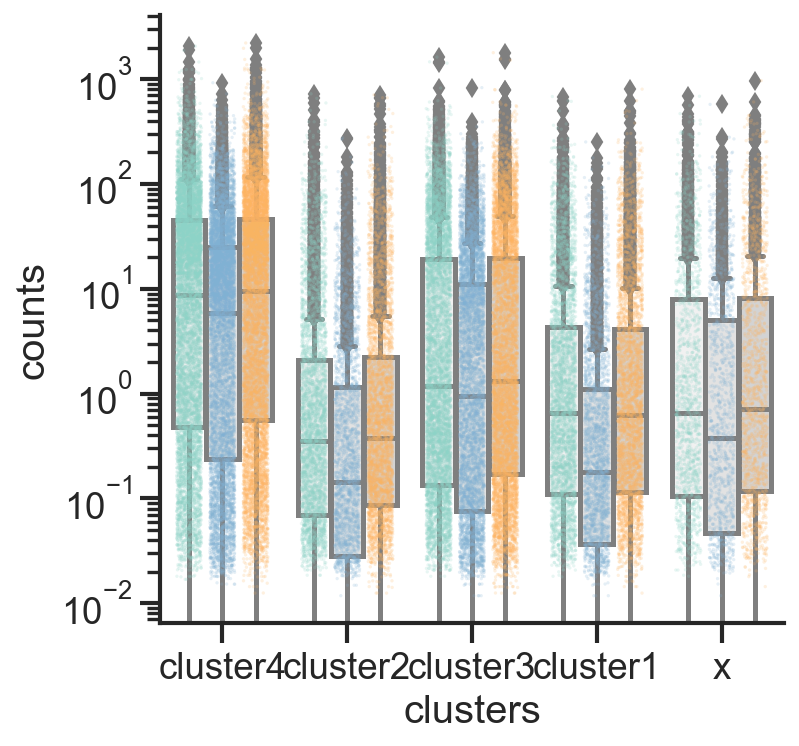

In [185]:
sumg_all['clusters'] = sumg_all['clusters'].fillna('x')

sns.boxplot(data = sumg_all, x = 'clusters', y = 'counts', hue = 'condition',
            dodge = True, color = 'lightgrey')
sns.stripplot(data = sumg_all, x = 'clusters', y = 'counts', hue = 'condition',
              dodge = True, palette = ['#8dd3c7','#80b1d3','#fdb462'],
                                                                                                         size = 1.5,alpha = 0.2, jitter = 0.3)
sns.despine()
plt.legend([],frameon=False)
plt.yscale('log')
plt.show()

In [186]:
adata_g.var[adata_g.var['clusters'] == 'cluster1']

,ensembl,chromosome,n_cells,highly_variable,means,dispersions,dispersions_norm,mean,std,clusters
Rrs1,ENSMUSG00000061024,1,2666,False,0.052506,-2.488471,-0.060240,9.227341e-12,0.059443,cluster1
Sgk3,ENSMUSG00000025915,1,261,False,0.003166,-2.368284,0.168119,4.895620e-12,0.015657,cluster1
Arfgef1,ENSMUSG00000067851,1,2604,True,0.052820,-2.172765,0.539612,-1.234521e-12,0.066451,cluster1
Slco5a1,ENSMUSG00000025938,1,676,False,0.010532,-2.258702,0.376329,-3.389275e-13,0.030424,cluster1
Stau2,ENSMUSG00000025920,1,2149,False,0.038056,-2.264705,0.364923,-4.713603e-12,0.055393,cluster1
...,...,...,...,...,...,...,...,...,...,...
4930517J16Rik,ENSMUSG00000102880,4,2,False,0.000026,-2.767461,-0.590333,-8.137588e-14,0.001236,cluster1
Gm48294,ENSMUSG00000111794,9,2,False,0.000016,-3.218554,-1.447428,-4.309702e-13,0.000784,cluster1
Olfr876,ENSMUSG00000066750,9,2,False,0.000018,-3.058043,-1.142452,-7.593935e-14,0.000884,cluster1
Tnf,ENSMUSG00000024401,17,2,False,0.000024,-2.823629,-0.697054,7.262603e-13,0.001164,cluster1


In [187]:
cluster1 = list(table[table['deepTools_group'] =='cluster_1']['genes'])
cluster2 = list(table[table['deepTools_group'] =='cluster_2']['genes'])
cluster3 = list(table[table['deepTools_group'] =='cluster_3']['genes'])
cluster4 = list(table[table['deepTools_group'] =='cluster_4']['genes'])
allgenes = list(table['genes'])


adata_g.obs['cluster1a'] = np.sum(adata_g[:, adata_g.var_names.isin(cluster1)].X, axis=1) 
adata_g.obs['cluster1b'] = np.sum(adata_g[:, adata_g.var_names.isin(cluster1)].raw.X, axis=1) 
adata_g.obs['cluster2a'] = np.sum(adata_g[:, adata_g.var_names.isin(cluster2)].X, axis=1) 
adata_g.obs['cluster2b'] = np.sum(adata_g[:, adata_g.var_names.isin(cluster2)].raw.X, axis=1) 
adata_g.obs['cluster3a'] = np.sum(adata_g[:, adata_g.var_names.isin(cluster3)].X, axis=1) 
adata_g.obs['cluster3b'] = np.sum(adata_g[:, adata_g.var_names.isin(cluster3)].raw.X, axis=1) 
adata_g.obs['cluster4a'] = np.sum(adata_g[:, adata_g.var_names.isin(cluster4)].X, axis=1) 
adata_g.obs['cluster4b'] = np.sum(adata_g[:, adata_g.var_names.isin(cluster4)].raw.X, axis=1) 


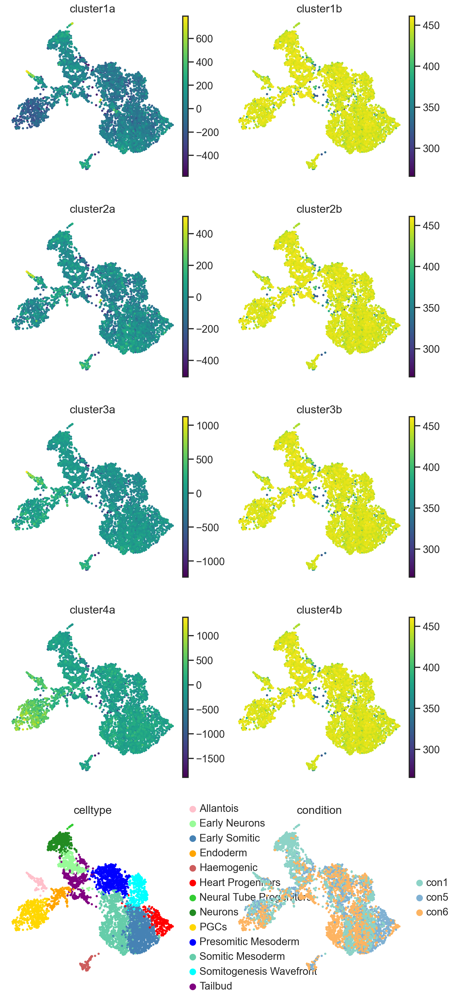

In [189]:
sc.pl.umap(adata_g, color = ['cluster1a','cluster1b',
                            'cluster2a','cluster2b',
                            'cluster3a','cluster3b',
                            'cluster4a','cluster4b',
                            'celltype','condition'], ncols = 2, frameon=False, sort_order=True,size=50, cmap='viridis')

cluster1a


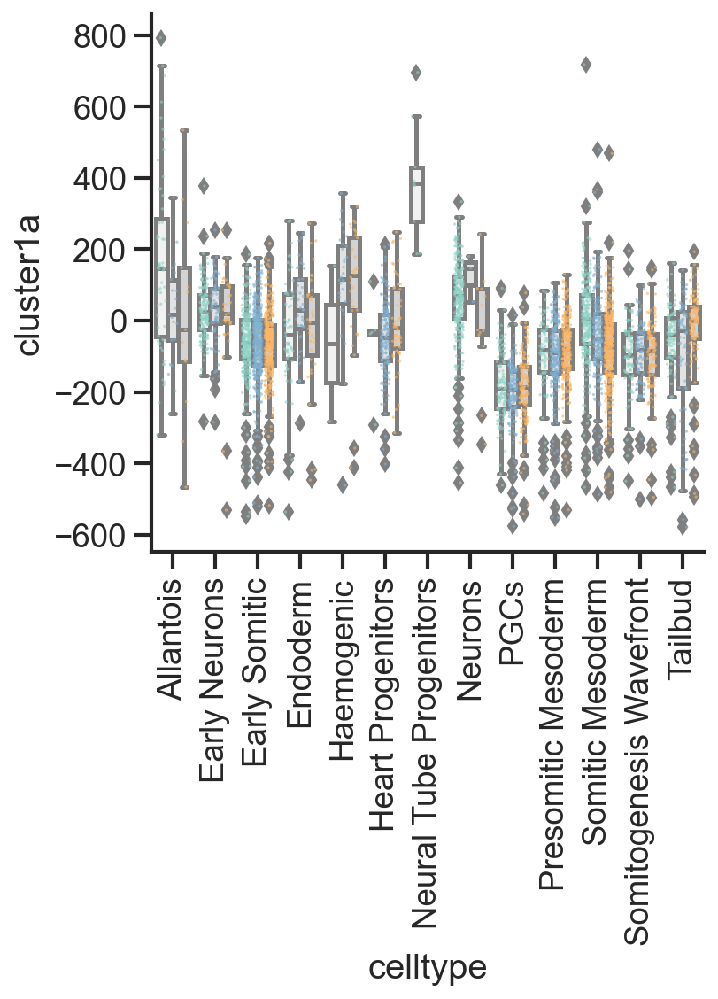

cluster1b


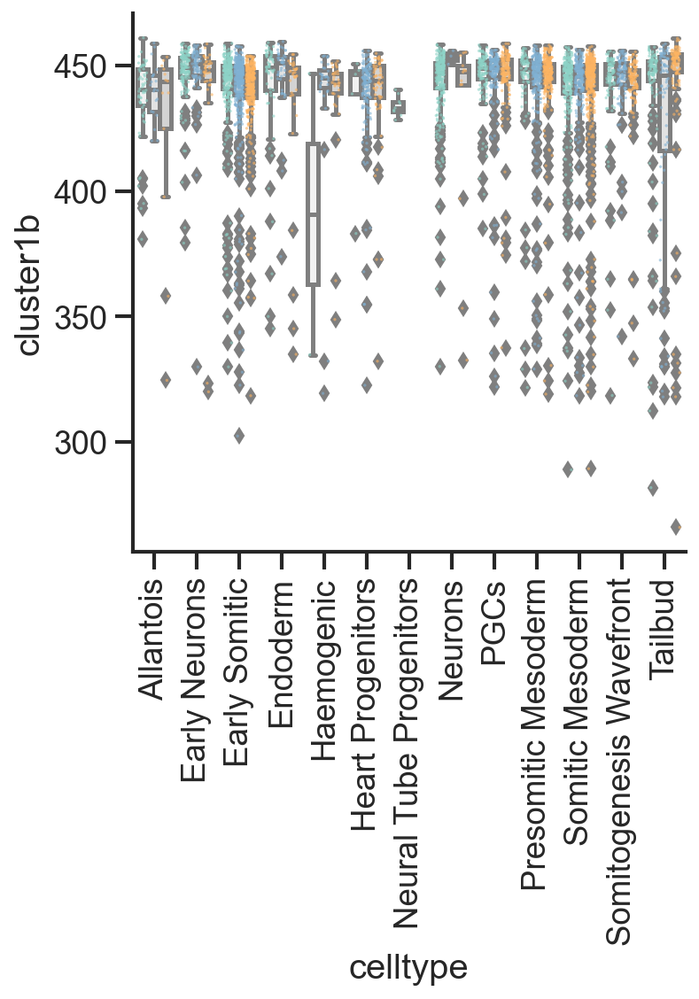

cluster2a


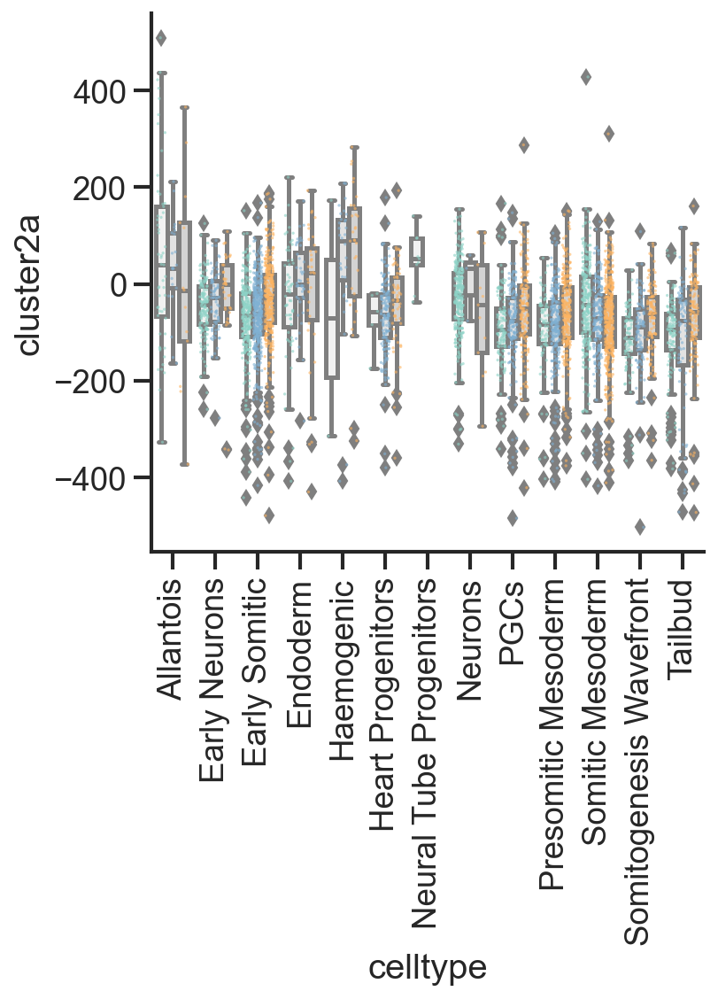

cluster2b


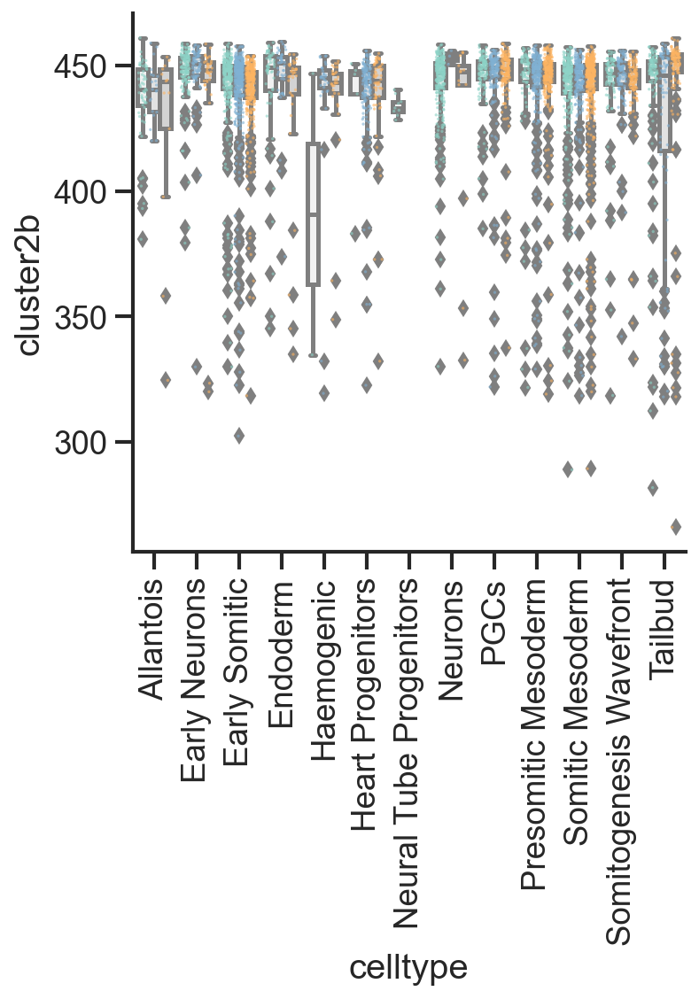

cluster3a


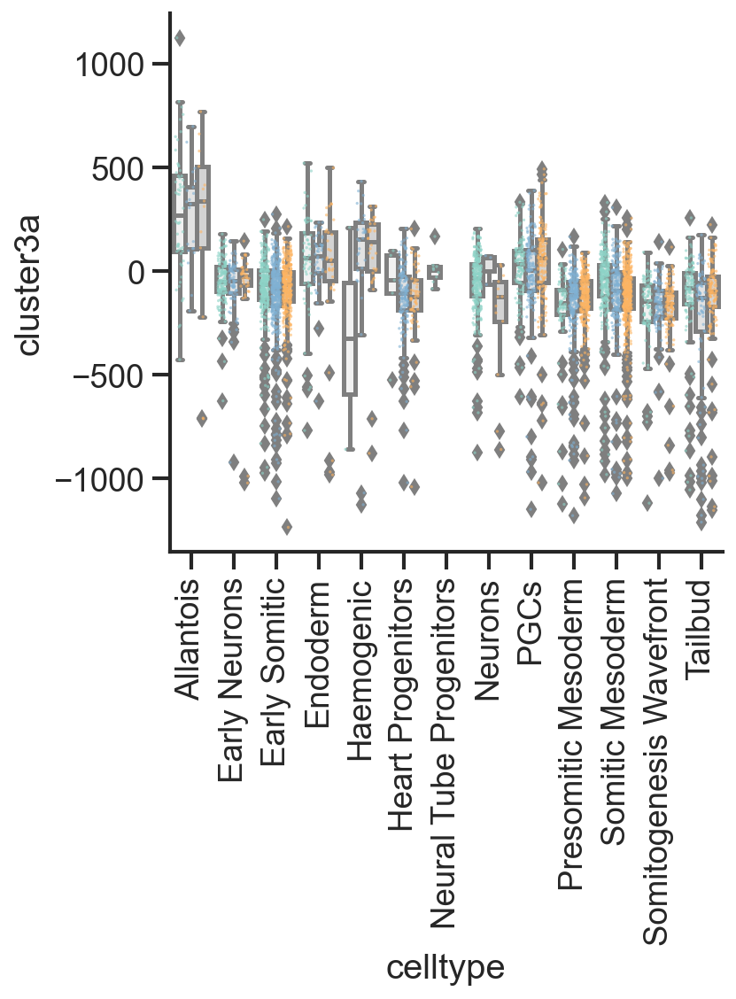

cluster3b


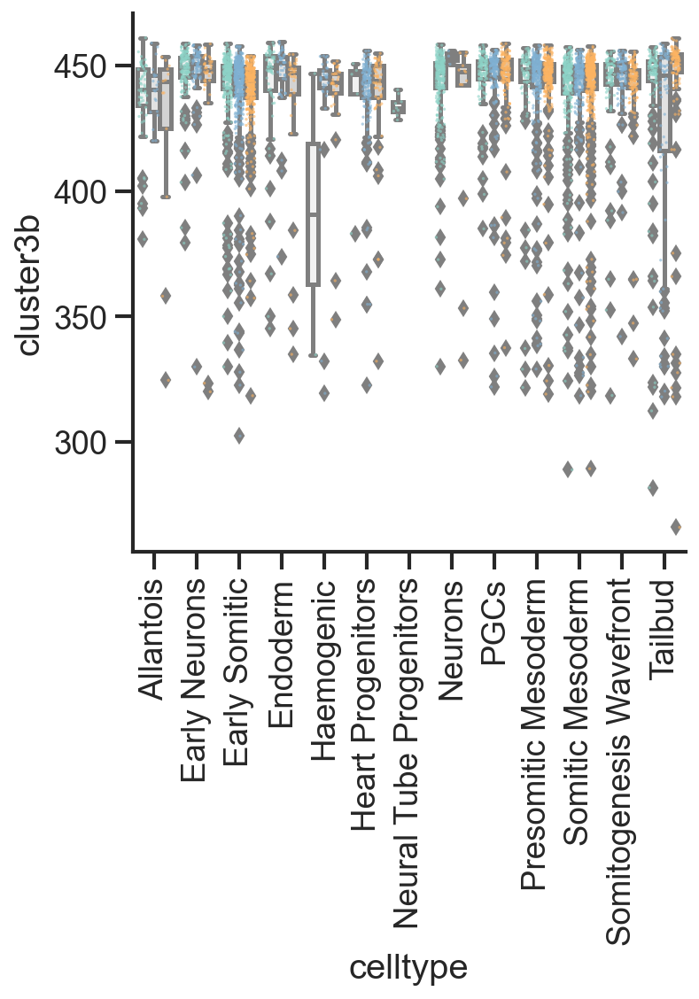

cluster4a


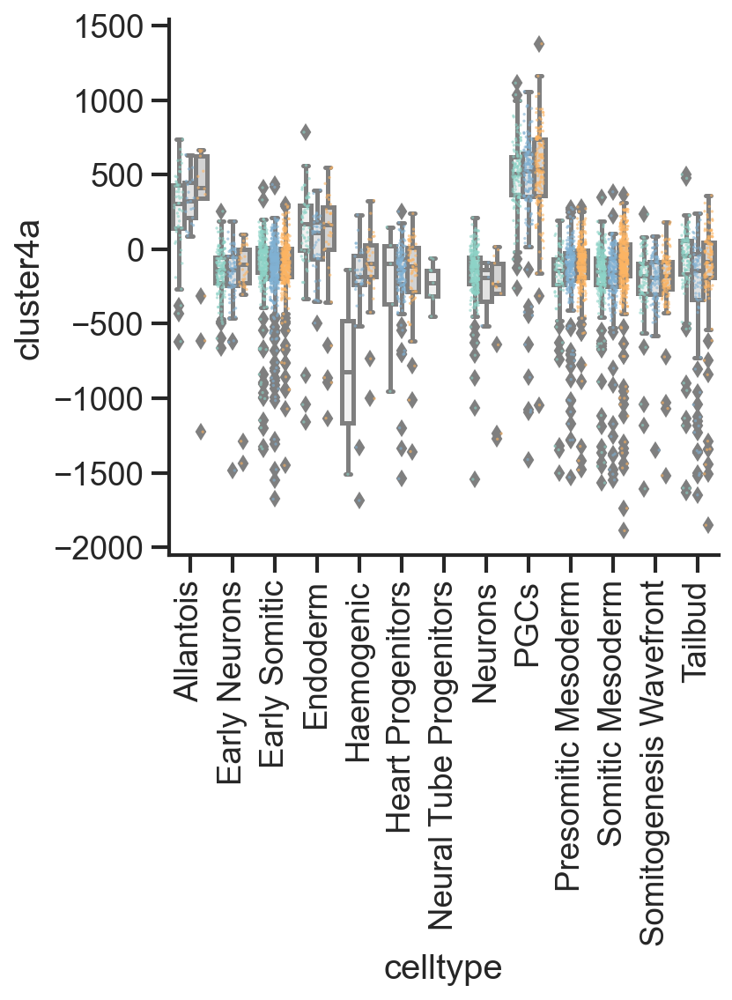

cluster4b


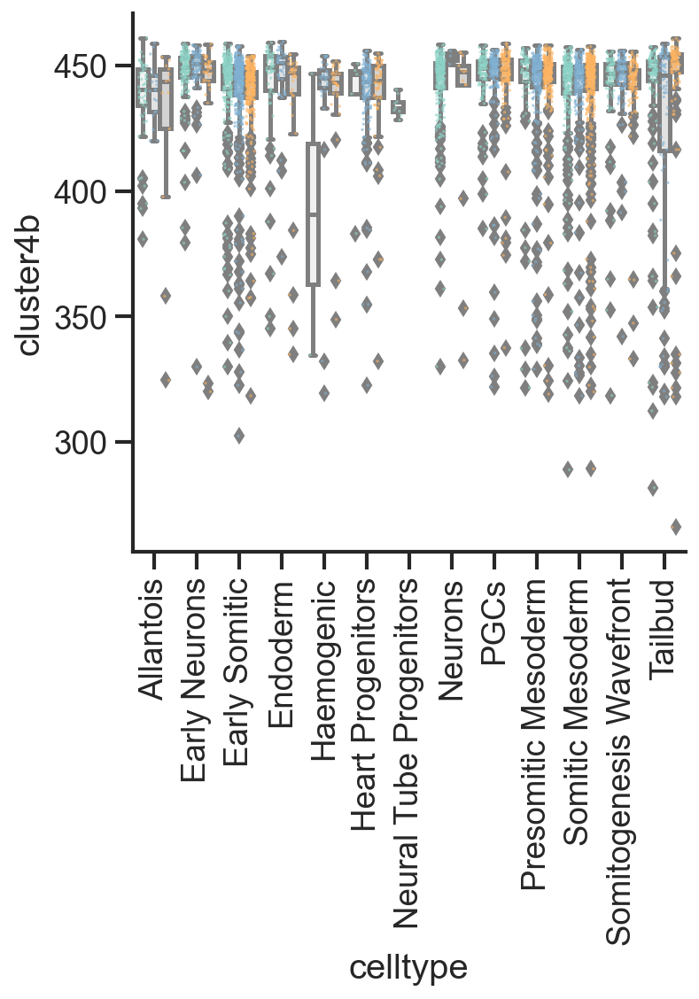

In [191]:
allcounts = ['cluster1a','cluster1b',
                            'cluster2a','cluster2b',
                            'cluster3a','cluster3b',
                            'cluster4a','cluster4b']
for count in allcounts:
    print(count)
    sns.boxplot(data = adata_g.obs, x = 'celltype', y = count, hue = 'condition', dodge = True, color = 'lightgrey')
    sns.stripplot(data = adata_g.obs, x = 'celltype', y = count, hue = 'condition', dodge = True, palette = ['#8dd3c7','#80b1d3','#fdb462'],
                                                                                                             size = 1.5,alpha = 0.6, jitter = 0.3)
    sns.despine()
    plt.legend([],frameon=False)
    #plt.yscale('log')
    plt.xticks(rotation=90)
    plt.show()

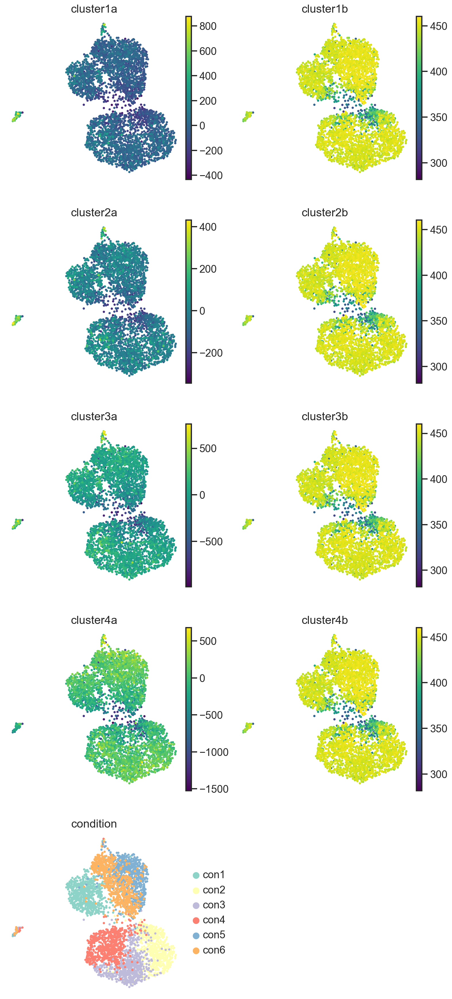

In [192]:
adata.obs['cluster1a'] = np.sum(adata[:, adata.var_names.isin(cluster1)].X, axis=1) 
adata.obs['cluster1b'] = np.sum(adata[:, adata.var_names.isin(cluster1)].raw.X, axis=1) 
adata.obs['cluster2a'] = np.sum(adata[:, adata.var_names.isin(cluster2)].X, axis=1) 
adata.obs['cluster2b'] = np.sum(adata[:, adata.var_names.isin(cluster2)].raw.X, axis=1) 
adata.obs['cluster3a'] = np.sum(adata[:, adata.var_names.isin(cluster3)].X, axis=1) 
adata.obs['cluster3b'] = np.sum(adata[:, adata.var_names.isin(cluster3)].raw.X, axis=1) 
adata.obs['cluster4a'] = np.sum(adata[:, adata.var_names.isin(cluster4)].X, axis=1) 
adata.obs['cluster4b'] = np.sum(adata[:, adata.var_names.isin(cluster4)].raw.X, axis=1) 

sc.pl.umap(adata, color = ['cluster1a','cluster1b',
                            'cluster2a','cluster2b',
                            'cluster3a','cluster3b',
                            'cluster4a','cluster4b',
                            'condition'], ncols = 2, frameon=False, sort_order=True,size=50, cmap='viridis')

cluster1a


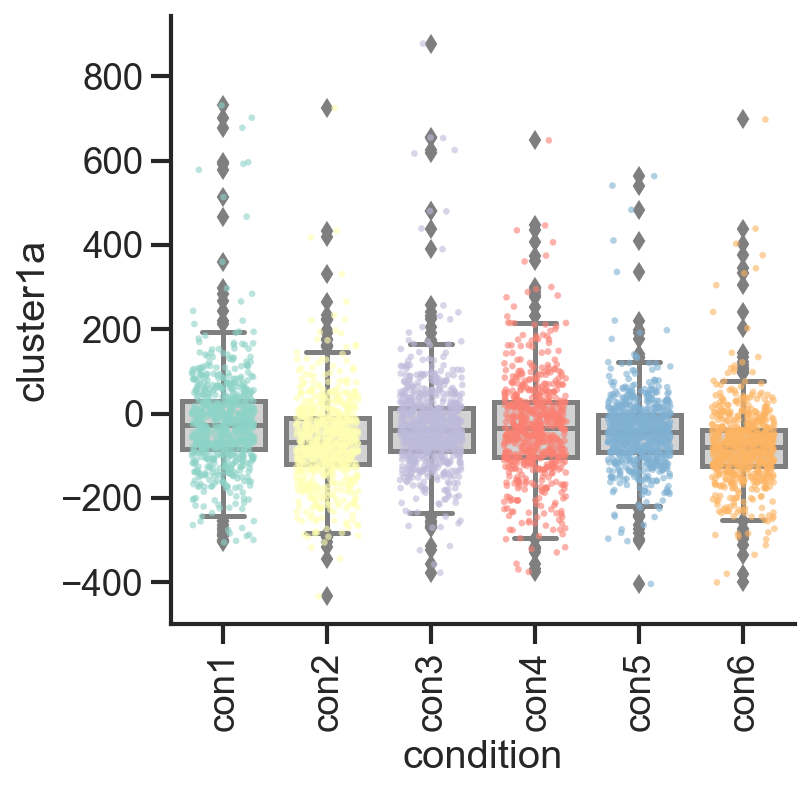

cluster1b


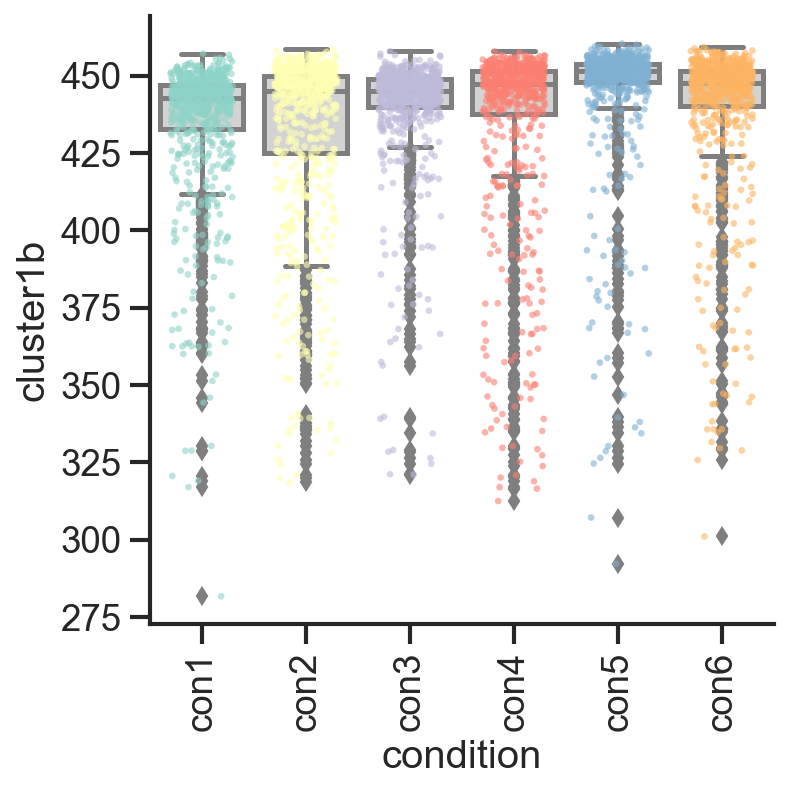

cluster2a


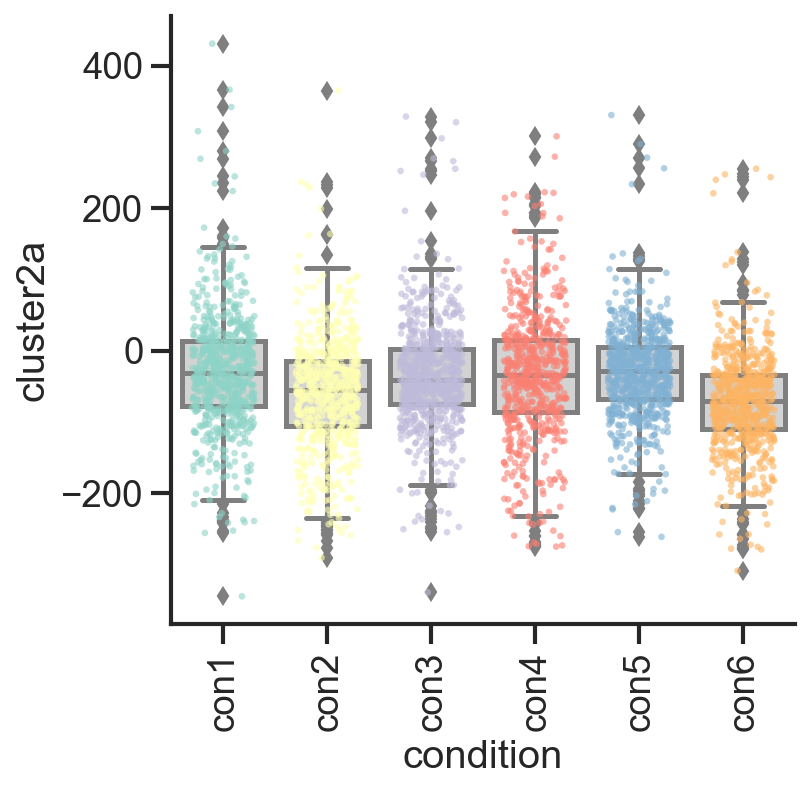

cluster2b


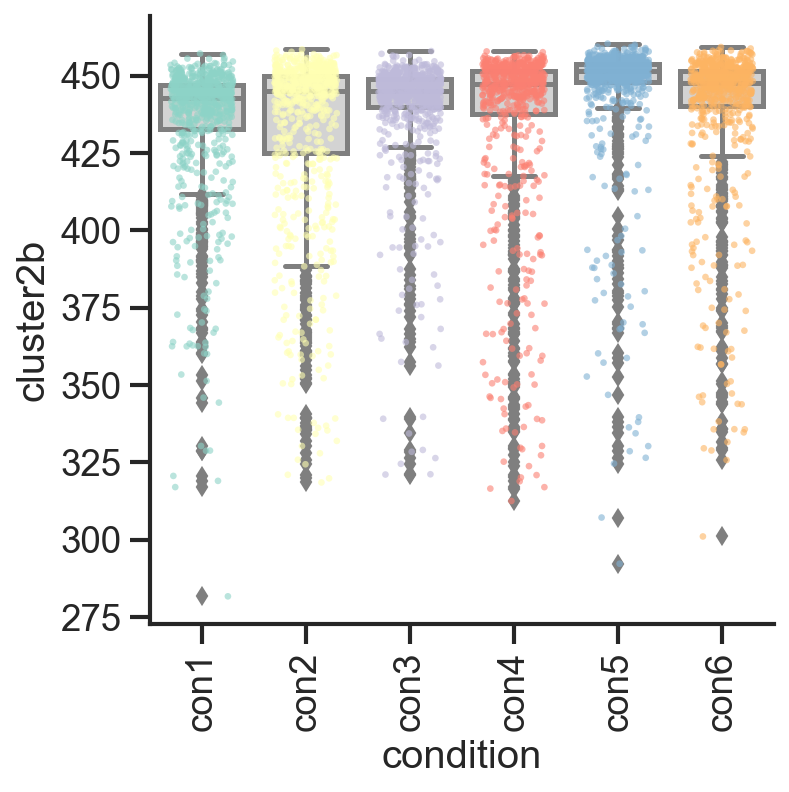

cluster3a


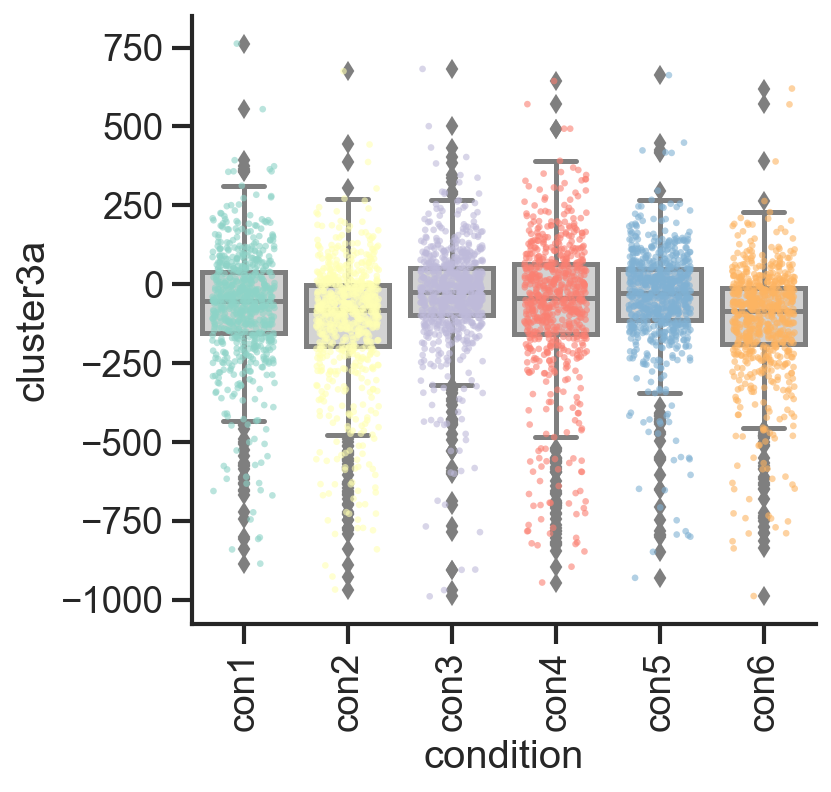

cluster3b


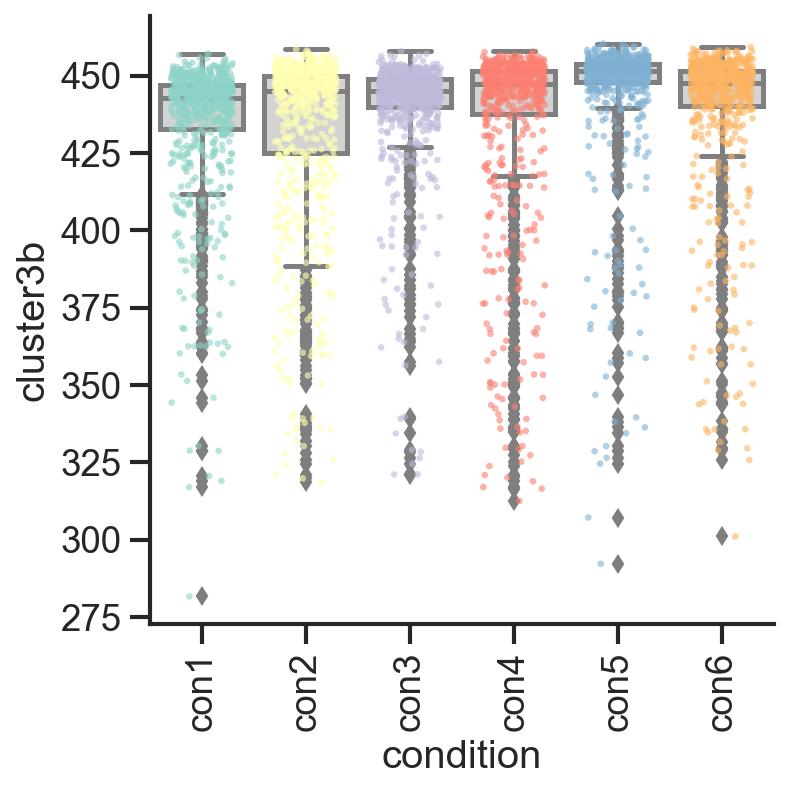

cluster4a


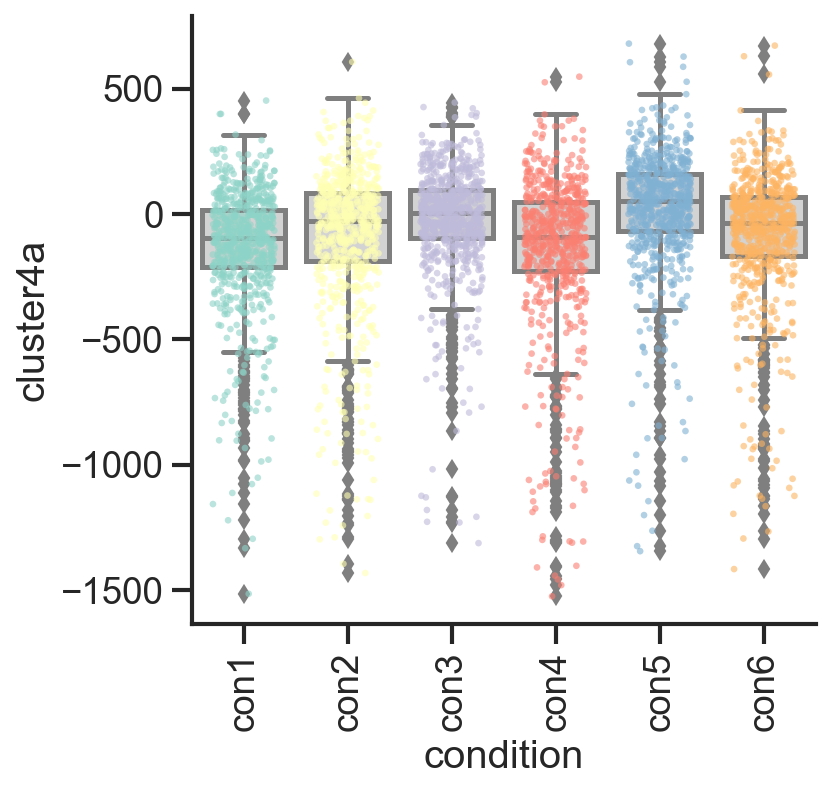

cluster4b


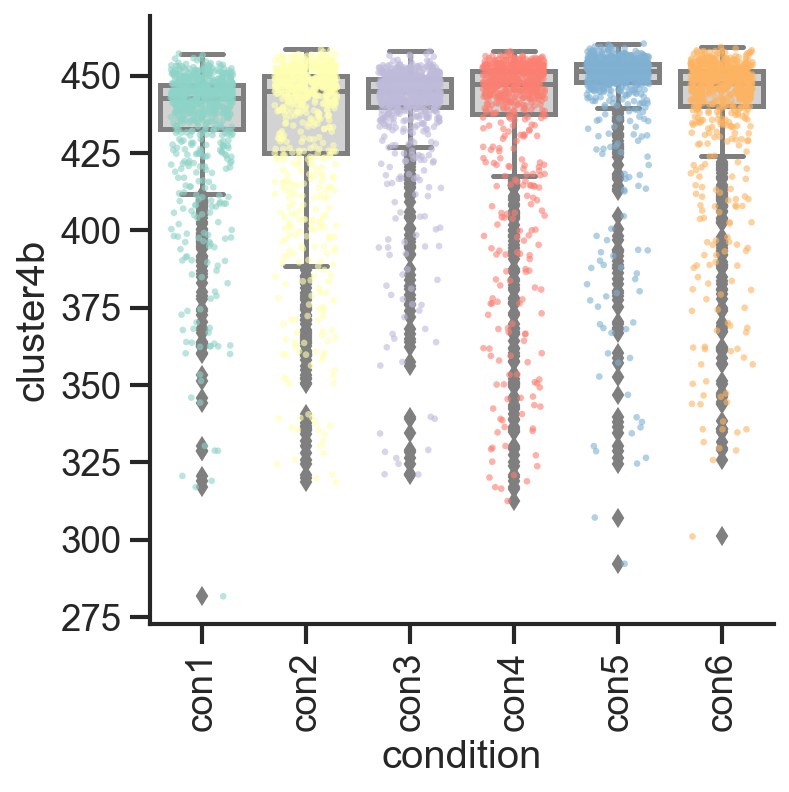

In [193]:
allcounts = ['cluster1a','cluster1b',
                            'cluster2a','cluster2b',
                            'cluster3a','cluster3b',
                            'cluster4a','cluster4b']
for count in allcounts:
    print(count)
    sns.boxplot(data = adata.obs, x = 'condition', y = count, color = 'lightgrey')
    sns.stripplot(data = adata.obs, x = 'condition', y = count,  palette = 'Set3',
                                                                                                             size = 3,alpha = 0.6, jitter = 0.3)
    sns.despine()
    plt.legend([],frameon=False)
    #plt.yscale('log')
    plt.xticks(rotation=90)
    plt.show()